In [1]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = 8, 5
plt.style.use('fivethirtyeight')

import seaborn as sns
sns.set()

import plotly.express as px
import plotly.offline as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import cufflinks as cf
cf.go_offline()
cf.set_config_file(world_readable=True, theme='pearl')

import folium
from folium import plugins
from datetime import datetime, timedelta

import bar_chart_race as bcr

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
from IPython.display import HTML
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
city_day_loc = r'AQI Data IND/city_day.csv'
cities_db_loc = f'IND Cities Database/Indian Cities Database.csv'

city_day = pd.read_csv(city_day_loc)
cities_db = pd.read_csv(cities_db_loc)

In [4]:
city_day

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


In [5]:
cities_db

,City,Lat,Long,country,iso2,State
0,Abohar,30.144533,74.195520,India,IN,Punjab
1,Adilabad,19.400000,78.310000,India,IN,Telangana
2,Agartala,23.836049,91.279386,India,IN,Tripura
3,Agra,27.187935,78.003944,India,IN,Uttar Pradesh
4,Ahmadnagar,19.094571,74.738432,India,IN,Maharashtra
...,...,...,...,...,...,...
208,Vizianagaram,18.113290,83.397743,India,IN,Andhra Pradesh
209,Warangal,17.978423,79.600209,India,IN,Telangana
210,Jorapokhar,23.700000,86.412670,India,IN,Jharkhand
211,Brajrajnagar,21.820000,83.920000,India,IN,Odisha


In [6]:
city_day['Date'] = pd.to_datetime(city_day['Date'])

In [7]:
city_day.info(), cities_db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        29531 non-null  object        
 1   Date        29531 non-null  datetime64[ns]
 2   PM2.5       24933 non-null  float64       
 3   PM10        18391 non-null  float64       
 4   NO          25949 non-null  float64       
 5   NO2         25946 non-null  float64       
 6   NOx         25346 non-null  float64       
 7   NH3         19203 non-null  float64       
 8   CO          27472 non-null  float64       
 9   SO2         25677 non-null  float64       
 10  O3          25509 non-null  float64       
 11  Benzene     23908 non-null  float64       
 12  Toluene     21490 non-null  float64       
 13  Xylene      11422 non-null  float64       
 14  AQI         24850 non-null  float64       
 15  AQI_Bucket  24850 non-null  object        
dtypes: datetime64[ns](1), 

(None, None)

**No nan in cities_db data**

In [8]:
city_day.City.unique().shape[0], city_day.AQI_Bucket.unique().shape[0]

(26, 7)

In [9]:
city_day.City.unique(), city_day.AQI_Bucket.unique()

(array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
        'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
        'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
        'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
        'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
        'Visakhapatnam'], dtype=object),
 array([nan, 'Poor', 'Very Poor', 'Severe', 'Moderate', 'Satisfactory',
        'Good'], dtype=object))

In [10]:
cities_db.country.unique(), cities_db.iso2.unique()

(array(['India'], dtype=object), array(['IN'], dtype=object))

**All entries are for India only**

### Checking how many common/uncommon entries are there:

In [11]:
np.all(np.in1d(cities_db.City.unique(), city_day.City.unique()))

False

In [12]:
set.intersection(set(cities_db.City.unique()), set(city_day.City.unique()))

{'Ahmedabad',
 'Amaravati',
 'Amritsar',
 'Bengaluru',
 'Brajrajnagar',
 'Chennai',
 'Coimbatore',
 'Delhi',
 'Gurugram',
 'Guwahati',
 'Hyderabad',
 'Jaipur',
 'Jorapokhar',
 'Kochi',
 'Lucknow',
 'Mumbai',
 'Patna',
 'Talcher',
 'Thiruvananthapuram'}

In [13]:
set(city_day.City.unique()) - set.intersection(set(cities_db.City.unique()), set(city_day.City.unique()))

{'Aizawl',
 'Bhopal',
 'Chandigarh',
 'Ernakulam',
 'Kolkata',
 'Shillong',
 'Visakhapatnam'}

**So, these cities information are not there in cities_db data**

In [14]:
city_day.isna().sum()

City              0
Date              0
PM2.5          4598
PM10          11140
NO             3582
NO2            3585
NOx            4185
NH3           10328
CO             2059
SO2            3854
O3             4022
Benzene        5623
Toluene        8041
Xylene        18109
AQI            4681
AQI_Bucket     4681
dtype: int64

In [15]:
city_day.AQI.notnull().sum()

24850

In [16]:
def missing_values_table(df):
    missing_count = df.isna().sum()
    missing_count = pd.DataFrame(missing_count, columns=['Count'])
    missing_count = missing_count.reset_index().rename(columns={'index': 'Column'})
    missing_count['percent'] = (missing_count.Count/len(df))*100
    missing_count = missing_count.sort_values('Count', ascending=False).reset_index(drop=True)
    return missing_count

In [17]:
mvt = missing_values_table(city_day)
mvt.style.background_gradient(cmap='Reds')

,Column,Count,percent
0,Xylene,18109,61.322001
1,PM10,11140,37.723071
2,NH3,10328,34.973418
3,Toluene,8041,27.229014
4,Benzene,5623,19.041008
5,AQI,4681,15.851139
6,AQI_Bucket,4681,15.851139
7,PM2.5,4598,15.570079
8,NOx,4185,14.171549
9,O3,4022,13.619586


**Observations**

- Many missing values in some columns like Xylene, NH3, etc
- It can be due to no measuring device at some places or due to some technical errors

### Checking Data availability

In [18]:
city_day.Date.min(), city_day.Date.max()

(Timestamp('2015-01-01 00:00:00'), Timestamp('2020-07-01 00:00:00'))

In [19]:
data = []
for city in city_day.City.unique():
    df = city_day.loc[city_day.City == city]
    for year in df.Date.dt.year.unique():
        dt = {'City': city, 'Year': year, 'From': df.Date.dt.year.min(), 'To': df.Date.dt.year.max(), 
              'Count': df.loc[df.Date.dt.year == year].shape[0]}
        data.append(dt)
        
data = pd.DataFrame(data)
data

,City,Year,From,To,Count
0,Ahmedabad,2015,2015,2020,365
1,Ahmedabad,2016,2015,2020,366
2,Ahmedabad,2017,2015,2020,365
3,Ahmedabad,2018,2015,2020,365
4,Ahmedabad,2019,2015,2020,365
...,...,...,...,...,...
98,Visakhapatnam,2016,2016,2020,184
99,Visakhapatnam,2017,2016,2020,365
100,Visakhapatnam,2018,2016,2020,365
101,Visakhapatnam,2019,2016,2020,365


In [20]:
data.loc[(~data.Count.isin([365, 366])) & ((data.Year != data.To) & (data.Year != data.From))]

,City,Year,From,To,Count


**As we can see that missing data are from first year or last year, we can say that that is due to data of installment at starting year or due to continuation of date in the last year**

In [21]:
data.loc[data.Year == 2020]

,City,Year,From,To,Count
5,Ahmedabad,2020,2015,2020,183
6,Aizawl,2020,2020,2020,113
10,Amaravati,2020,2017,2020,183
14,Amritsar,2020,2017,2020,183
20,Bengaluru,2020,2015,2020,183
22,Bhopal,2020,2019,2020,183
26,Brajrajnagar,2020,2017,2020,183
28,Chandigarh,2020,2019,2020,183
34,Chennai,2020,2015,2020,183
36,Coimbatore,2020,2019,2020,183


In [22]:
data.loc[(data.Year == 2020) & (data.Count != 183)]

,City,Year,From,To,Count
6,Aizawl,2020,2020,2020,113
43,Ernakulam,2020,2020,2020,162
66,Kochi,2020,2020,2020,162


**So, some data is missing for Aizawl, Ernakulam and Kochi**

### Let's check further to see if those are okay or randomly from somewhere in the middle

**Checkin for the baseline Dates: looking for Ahmedabad**

In [23]:
city_day.loc[(city_day.City == 'Ahmedabad') & (city_day.Date.dt.year == 2020)]

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
1826,Ahmedabad,2020-01-01,79.57,131.62,3.78,12.64,8.99,NaN,3.78,27.70,23.67,4.21,31.42,2.52,216.0,Poor
1827,Ahmedabad,2020-01-02,72.59,128.86,3.63,14.38,9.73,NaN,3.63,23.96,23.67,3.71,31.14,2.52,162.0,Moderate
1828,Ahmedabad,2020-01-03,69.54,128.99,7.06,15.13,12.65,NaN,7.06,35.78,23.66,4.78,31.14,2.52,220.0,Poor
1829,Ahmedabad,2020-01-04,66.20,138.47,8.97,20.79,16.84,NaN,8.97,38.98,23.65,4.12,31.14,2.52,254.0,Poor
1830,Ahmedabad,2020-01-05,55.99,110.41,5.41,15.34,11.53,NaN,5.41,45.83,23.61,3.30,31.14,2.52,255.0,Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,Ahmedabad,2020-06-27,62.12,118.67,9.18,56.35,19.86,NaN,0.49,12.44,68.05,1.32,37.76,1.62,92.0,Satisfactory
2005,Ahmedabad,2020-06-28,31.57,NaN,6.37,23.99,16.40,NaN,0.52,11.01,26.34,1.37,49.58,1.34,82.0,Satisfactory
2006,Ahmedabad,2020-06-29,29.75,127.98,9.06,25.15,18.92,NaN,0.67,12.10,34.99,1.39,60.21,0.79,74.0,Satisfactory
2007,Ahmedabad,2020-06-30,40.02,121.10,7.09,58.92,33.41,NaN,0.73,16.39,41.64,1.21,44.10,1.35,98.0,Satisfactory


**So, we have perfect data:**
- Starting from 2020-01-01
- Ending at 2020-07-01

**Aizawl**

In [24]:
city_day.loc[(city_day.City == 'Aizawl') & (city_day.Date.dt.year == 2020)]

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
2009,Aizawl,2020-03-11,32.69,47.91,6.99,2.85,11.93,26.64,0.60,4.53,4.48,0.03,0.30,NaN,NaN,NaN
2010,Aizawl,2020-03-12,31.21,38.66,7.20,1.27,10.65,25.63,0.56,4.22,2.81,0.01,0.08,NaN,52.0,Satisfactory
2011,Aizawl,2020-03-13,38.39,46.68,7.19,0.91,10.37,29.16,0.57,4.46,0.18,0.00,0.00,NaN,60.0,Satisfactory
2012,Aizawl,2020-03-14,43.23,50.83,7.14,1.07,10.48,28.95,0.57,4.53,0.41,0.00,0.00,NaN,62.0,Satisfactory
2013,Aizawl,2020-03-15,33.82,41.03,7.09,0.36,9.73,28.41,0.48,4.63,0.30,0.00,0.00,NaN,70.0,Satisfactory
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2117,Aizawl,2020-06-27,0.16,3.16,11.69,0.07,15.41,22.42,0.02,1.08,1.29,NaN,NaN,NaN,19.0,Good
2118,Aizawl,2020-06-28,0.24,1.15,11.56,0.05,15.14,25.45,0.02,1.38,1.40,NaN,NaN,NaN,19.0,Good
2119,Aizawl,2020-06-29,0.28,10.02,12.04,0.13,15.96,28.73,0.12,2.03,0.95,NaN,NaN,NaN,20.0,Good
2120,Aizawl,2020-06-30,1.89,9.27,11.91,0.10,15.75,28.68,0.11,2.23,1.16,NaN,NaN,NaN,20.0,Good


**Checking for data leak**

In [25]:
len(pd.date_range(start=pd.to_datetime('2020-03-11'), end=pd.to_datetime('2020-07-01')))

113

**Ernakulam**

In [26]:
city_day.loc[(city_day.City == 'Ernakulam') & (city_day.Date.dt.year == 2020)]

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
12238,Ernakulam,2020-01-22,37.48,80.65,127.81,7.76,135.57,101.97,1.94,3.34,NaN,0.64,1.01,0.12,NaN,NaN
12239,Ernakulam,2020-01-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12240,Ernakulam,2020-01-24,41.13,68.71,125.76,7.95,133.71,102.66,1.12,3.46,NaN,0.68,1.87,0.31,NaN,NaN
12241,Ernakulam,2020-01-25,53.00,84.58,126.22,7.80,134.02,104.05,1.17,3.48,NaN,0.90,1.93,0.19,154.0,Moderate
12242,Ernakulam,2020-01-26,58.31,85.47,125.14,7.95,133.09,103.20,1.20,3.54,NaN,1.15,1.83,0.18,153.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12395,Ernakulam,2020-06-27,12.14,27.94,5.19,2.16,3.29,4.78,2.43,2.69,NaN,0.38,1.43,0.09,108.0,Moderate
12396,Ernakulam,2020-06-28,8.97,21.47,7.27,2.00,4.63,7.32,2.16,2.66,NaN,0.27,0.98,0.00,106.0,Moderate
12397,Ernakulam,2020-06-29,12.22,24.97,5.44,2.17,3.45,5.06,2.41,2.74,NaN,0.18,0.30,0.04,109.0,Moderate
12398,Ernakulam,2020-06-30,11.87,30.24,3.80,2.35,2.39,2.99,2.42,2.65,NaN,0.00,0.00,0.00,109.0,Moderate


In [27]:
len(pd.date_range(start=pd.to_datetime('2020-01-22'), end=pd.to_datetime('2020-07-01')))

162

**Kochi**

In [28]:
city_day.loc[(city_day.City == 'Kochi') & (city_day.Date.dt.year == 2020)]

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
18870,Kochi,2020-01-22,46.54,113.87,21.86,84.84,99.99,27.89,1.25,7.01,19.69,NaN,0.00,NaN,NaN,NaN
18871,Kochi,2020-01-23,62.48,110.34,22.08,55.67,73.57,25.35,1.33,6.48,9.54,NaN,0.00,NaN,110.0,Moderate
18872,Kochi,2020-01-24,62.87,114.86,37.44,60.49,97.80,25.60,1.44,6.91,9.06,NaN,0.00,NaN,111.0,Moderate
18873,Kochi,2020-01-25,61.76,113.70,92.78,67.73,160.51,22.11,1.34,6.68,11.29,NaN,0.00,NaN,144.0,Moderate
18874,Kochi,2020-01-26,66.76,113.24,106.79,58.69,165.49,20.70,1.36,6.75,11.43,NaN,0.05,NaN,197.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19027,Kochi,2020-06-27,16.29,26.08,21.97,2.06,22.09,NaN,1.64,21.19,1.59,NaN,0.00,NaN,89.0,Satisfactory
19028,Kochi,2020-06-28,13.42,19.38,24.59,2.21,24.74,NaN,1.48,21.23,0.65,NaN,0.04,NaN,82.0,Satisfactory
19029,Kochi,2020-06-29,19.95,38.86,27.75,2.36,27.92,NaN,1.64,19.74,0.74,NaN,0.00,NaN,84.0,Satisfactory
19030,Kochi,2020-06-30,19.36,41.74,20.62,2.42,20.78,NaN,1.67,20.68,1.27,NaN,0.00,NaN,90.0,Satisfactory


In [29]:
len(pd.date_range(start=pd.to_datetime('2020-01-22'), end=pd.to_datetime('2020-07-01')))

162

**So, for all 3 cities, data from starting of 2020 to some dates are missing with no data leak in the middle**
- Aizawl, data till 2020-03-10 is missing
- Ernakulam, data till 2020-01-22 is missing
- Kochi, data till 2020-01-22 is missing

## Adding few features

In [30]:
city_day['BTX'] = city_day['Benzene'] + city_day['Toluene'] + city_day['Xylene']
city_day.drop(columns=['Benzene', 'Toluene', 'Xylene'], inplace=True)
city_day.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket,BTX
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,NaN,NaN,0.02
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,NaN,NaN,12.95
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,NaN,NaN,25.45
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,NaN,NaN,15.57
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,NaN,NaN,28.68


In [31]:
city_day['Particulate_matter'] = city_day['PM2.5'] + city_day['PM10']
city_day.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket,BTX,Particulate_matter
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,NaN,NaN,0.02,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,NaN,NaN,12.95,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,NaN,NaN,25.45,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,NaN,NaN,15.57,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,NaN,NaN,28.68,NaN


In [32]:
pollutants = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3', 'BTX']

In [33]:
city_day[pollutants].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PM2.5   24933 non-null  float64
 1   PM10    18391 non-null  float64
 2   NO2     25946 non-null  float64
 3   CO      27472 non-null  float64
 4   SO2     25677 non-null  float64
 5   O3      25509 non-null  float64
 6   BTX     11417 non-null  float64
dtypes: float64(7)
memory usage: 1.6 MB


# EDA

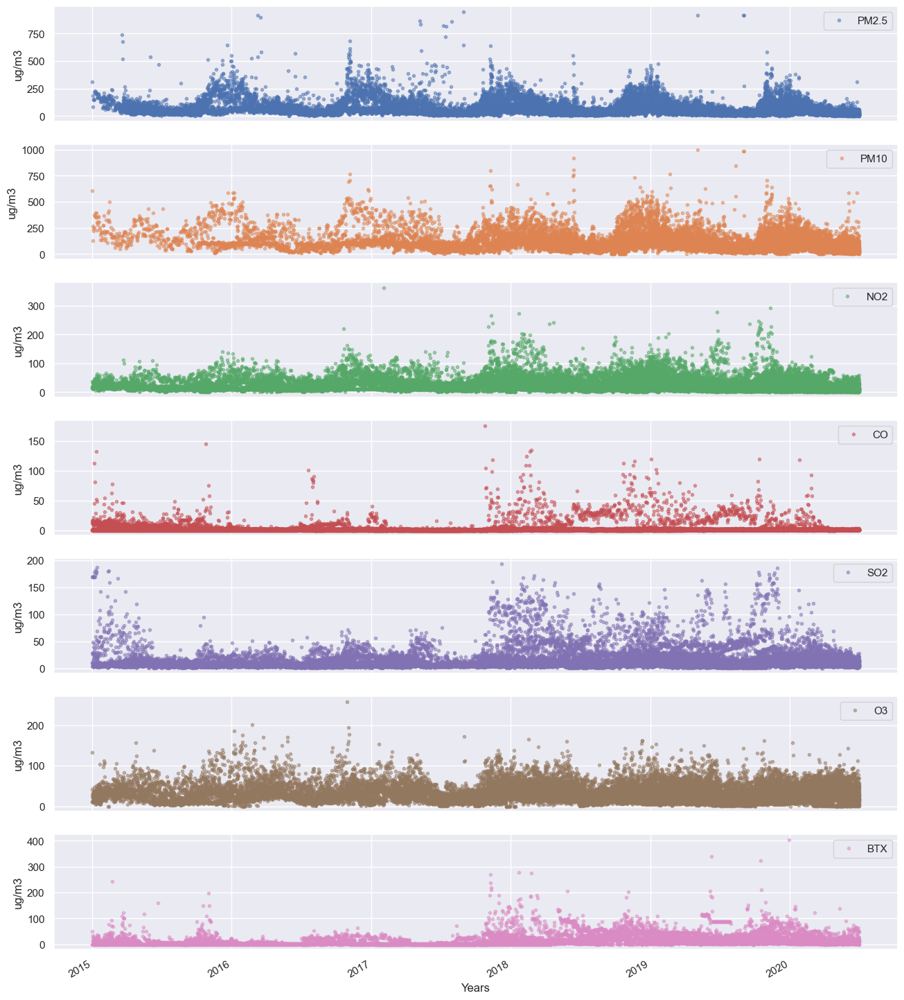

In [34]:
axes = city_day.set_index('Date')[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(14, 20), subplots=True)

for ax in axes:
    ax.set_xlabel('Years')
    ax.set_ylabel('ug/m3')

**SO2 and BTX sees sudden rise after 2018**


### PM2.5 and PM10

In [35]:
px.scatter(city_day, x='Date', y='PM2.5', color='City')

**PM2.5 shows seasonal nature**

In [36]:
px.scatter(city_day, x='Date', y='PM10', color='City')

**Like PM2.5, PM10 is also seasonal for most of the cities**
- Data is missing for many cities
- Both are also higher during winter months

In [37]:
city_day['Year'] = city_day['Date'].dt.year
city_day['Month'] = city_day['Date'].dt.month

city_day.head(3)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket,BTX,Particulate_matter,Year,Month
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,NaN,NaN,0.02,NaN,2015,1
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,NaN,NaN,12.95,NaN,2015,1
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,NaN,NaN,25.45,NaN,2015,1


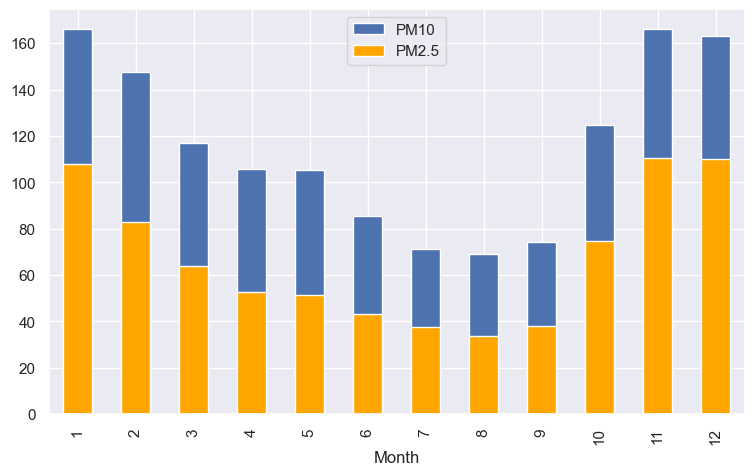

In [38]:
city_day[['PM2.5', 'PM10', 'Month']].groupby(['Month'])['PM10'].mean().plot(kind='bar', label='PM10')
city_day[['PM2.5', 'PM10', 'Month']].groupby(['Month'])['PM2.5'].mean().plot(kind='bar', color='orange', label='PM2.5')
plt.legend()
plt.show()

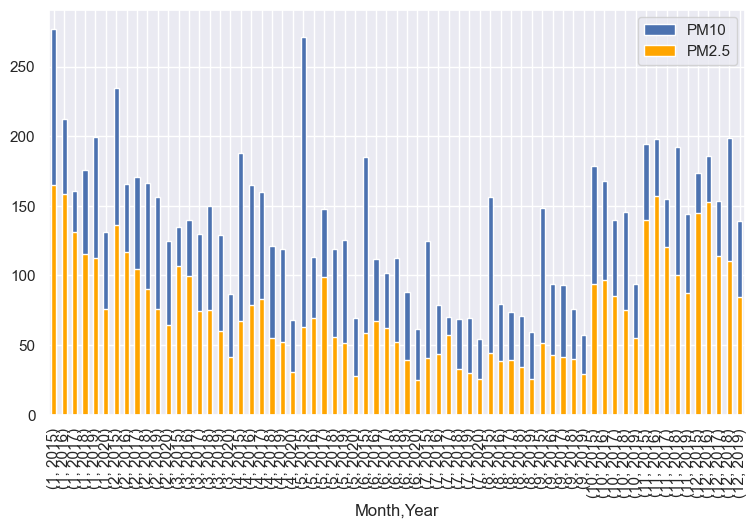

In [39]:
city_day[['PM2.5', 'PM10', 'Month', 'Year']].groupby(['Month', 'Year'])['PM10'].mean().plot(kind='bar', label='PM10')
city_day[['PM2.5', 'PM10', 'Month', 'Year']].groupby(['Month', 'Year'])['PM2.5'].mean().plot(kind='bar', color='orange', label='PM2.5')
plt.legend()
plt.show()

**Both PM2.5 and PM10 are relatable seasonal**

In [40]:
px.bar(city_day[['PM2.5', 'PM10', 'Month', 'Year']].groupby(['Month', 'Year'])['PM10', 'PM2.5'].mean().reset_index(), y=['PM10', 'PM2.5'])

**Clearly Seasonal**

In [41]:
px.bar(city_day[['PM2.5', 'PM10', 'Month', 'Year']].groupby(['Month', 'Year'])['PM10', 'PM2.5'].mean().reset_index(), x='Month', y=['PM10', 'PM2.5'], color='Year')

## Seasonal Decompose

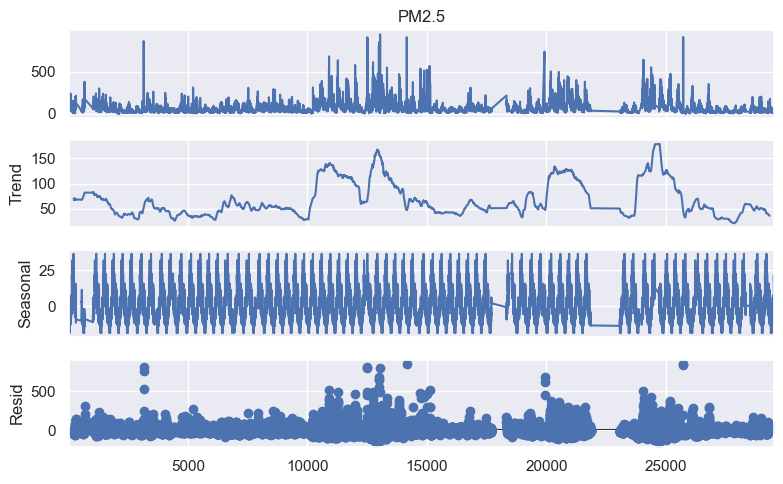

In [42]:
seasonal_decompose(city_day['PM2.5'].dropna(), model='additive', period=365).plot();

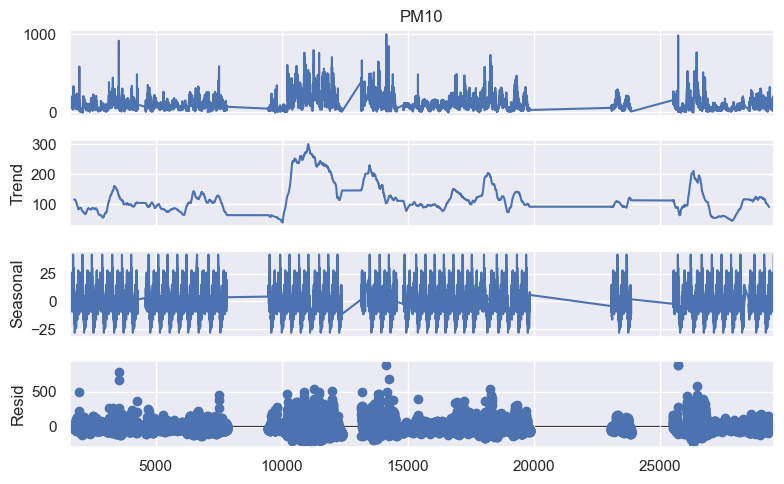

In [43]:
seasonal_decompose(city_day['PM10'].dropna(), model='additive', period=365).plot();

**Not a strong trend, however a strong seasonality is confirmed here**

### SO2

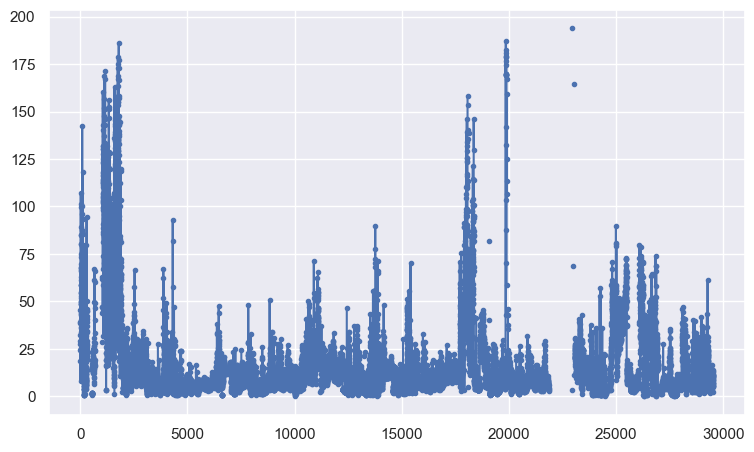

In [44]:
city_day.SO2.plot(marker='.');

In [45]:
x = pd.DataFrame(city_day.groupby(['Month', 'Year', 'City'])['SO2'].mean()).reset_index().set_index(['Month', 'Year'])

px.line(data_frame=x.reset_index(), y='SO2', color='City')

In [46]:
def detailed_plot(df, value):
    fig, ax = plt.subplots(3, 2, figsize=(10, 10))
    
    d = pd.DataFrame(df.groupby(['Month', 'Year'])[value].mean()).reset_index()

    sns.lineplot(d.pivot(index=['Year'], columns=['Month'], values=[value]), ax=ax[0][0])
    sns.lineplot(d.pivot(index=['Month'], columns=['Year'], values=[value]), ax=ax[0][1])

    ax[0][0].set_title(f'{value} mean by Year')
    ax[0][1].set_title(f'{value} mean by Month')

    sns.boxplot(data=df, y=value, x='Year', ax=ax[1][0])
    sns.boxplot(data=df, y=value, ax=ax[1][1])

    ax[1][0].set_title(f'{value} Boxplot by Year')
    ax[1][1].set_title(f'Overall {value} Boxplot')

    df[[value, 'Year']].groupby(['Year'])[value].mean().plot(kind='bar', label=value, ax=ax[2][0])
    df[[value, 'Month']].groupby(['Month'])[value].mean().plot(kind='bar', label=value, ax=ax[2][1])

    ax[2][0].set_title(f'{value} Yearly mean')
    ax[2][1].set_title(f'{value} Monthly mean')
    
    sorted_df = df.groupby(['Month', 'Year'])[value].mean().reset_index().sort_values('Year').reset_index(drop=True)
    sorted_df.set_index(['Month', 'Year']).plot(marker='.', linewidth=2, figsize=(8, 4))
    plt.title(f'{value} mean with year and month')
    plt.ylabel(f'{value} mean')

    seasonal_decompose(df[value].dropna(), model='additive', period=365).plot()

    fig.tight_layout()

**SO2**

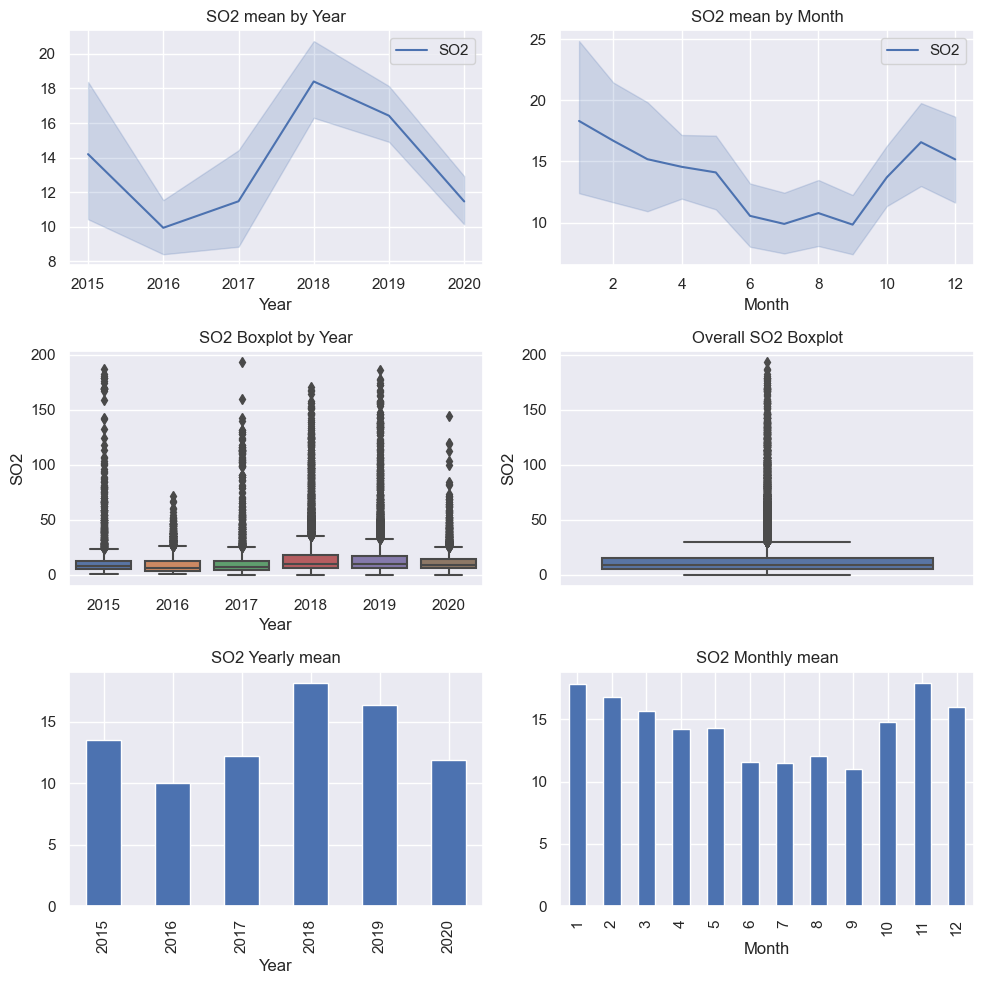

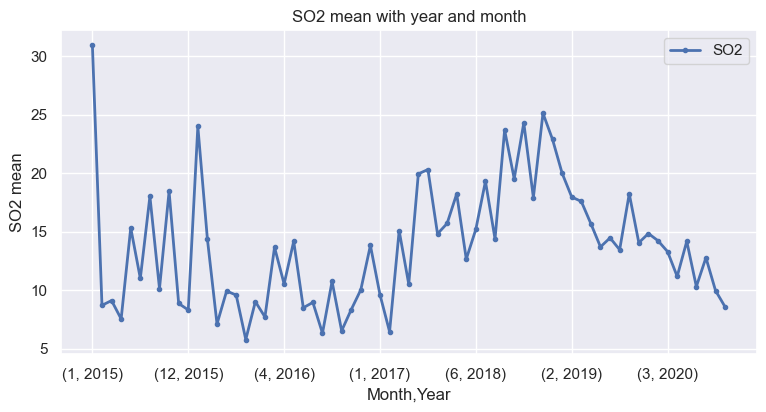

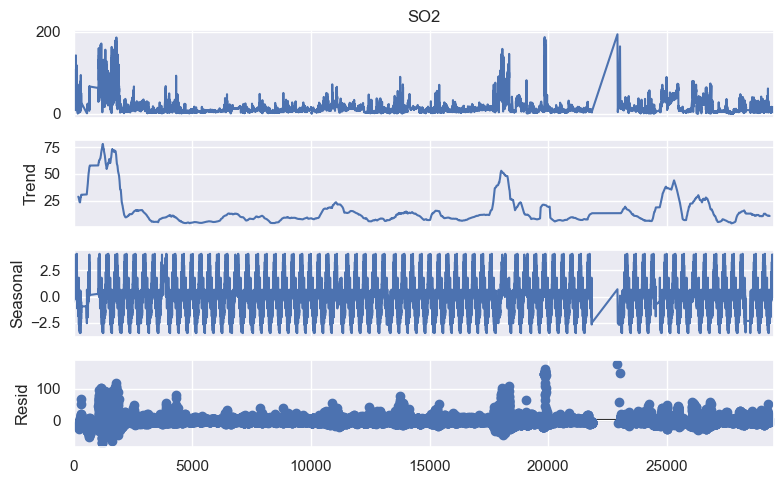

In [47]:
detailed_plot(city_day, 'SO2')

**NO**

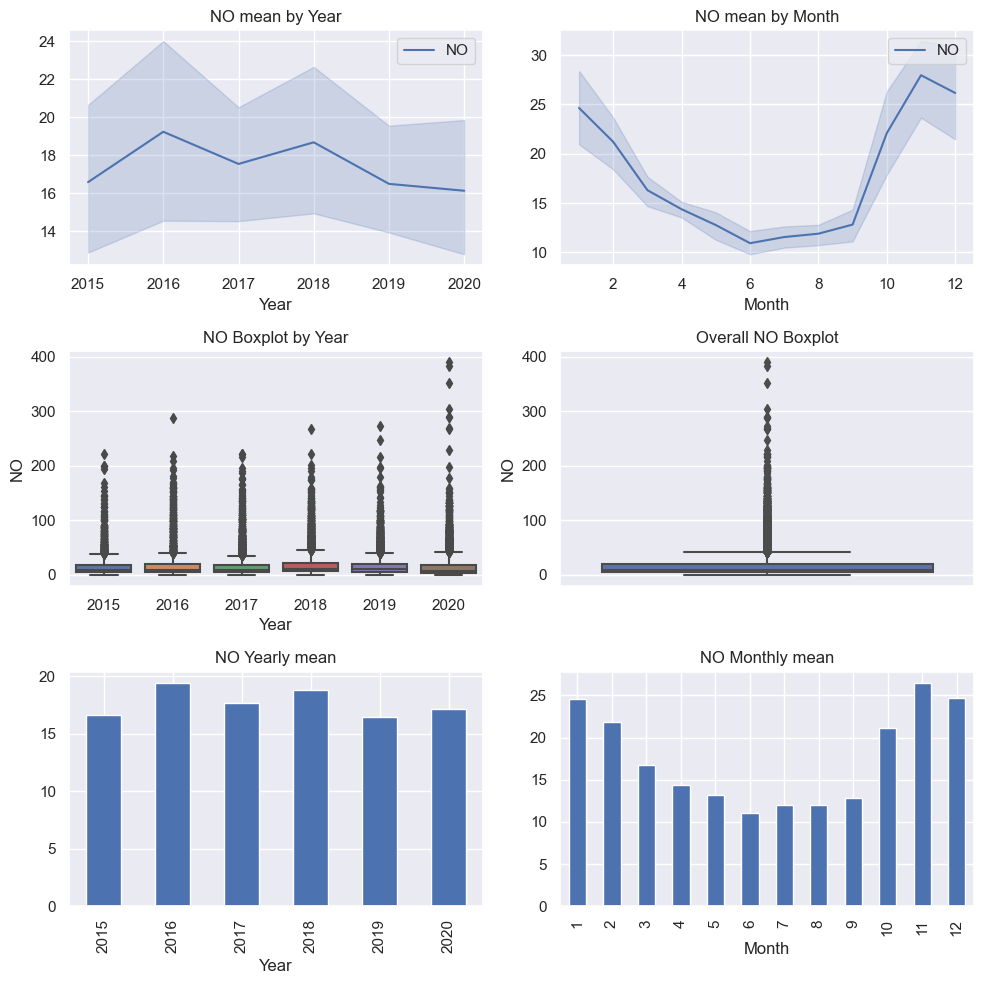

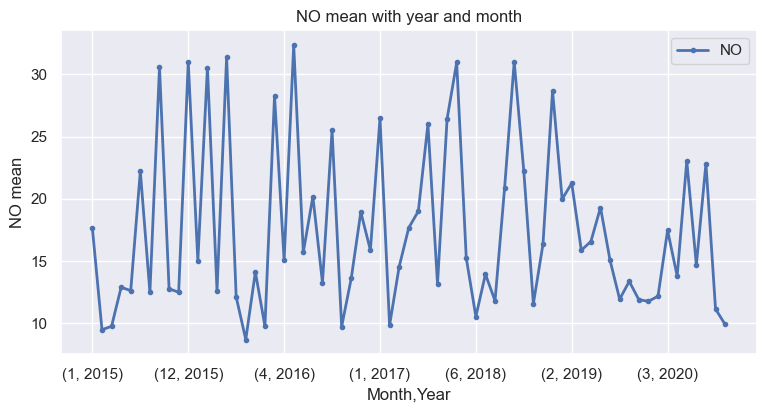

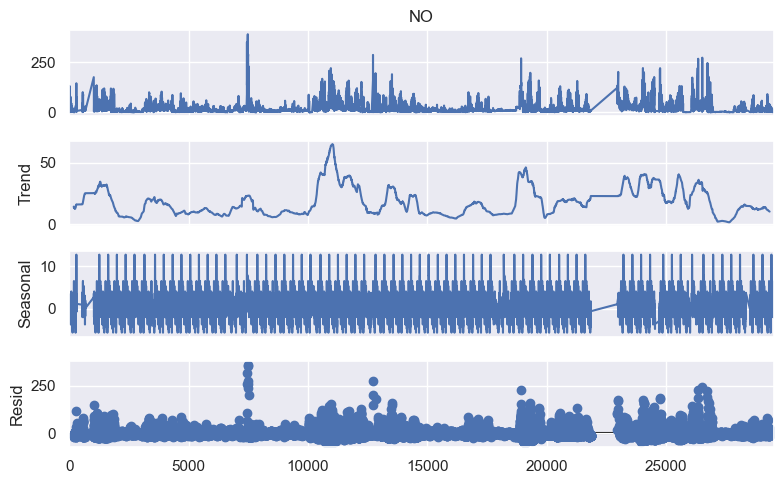

In [48]:
detailed_plot(city_day, 'NO')

**BTX**

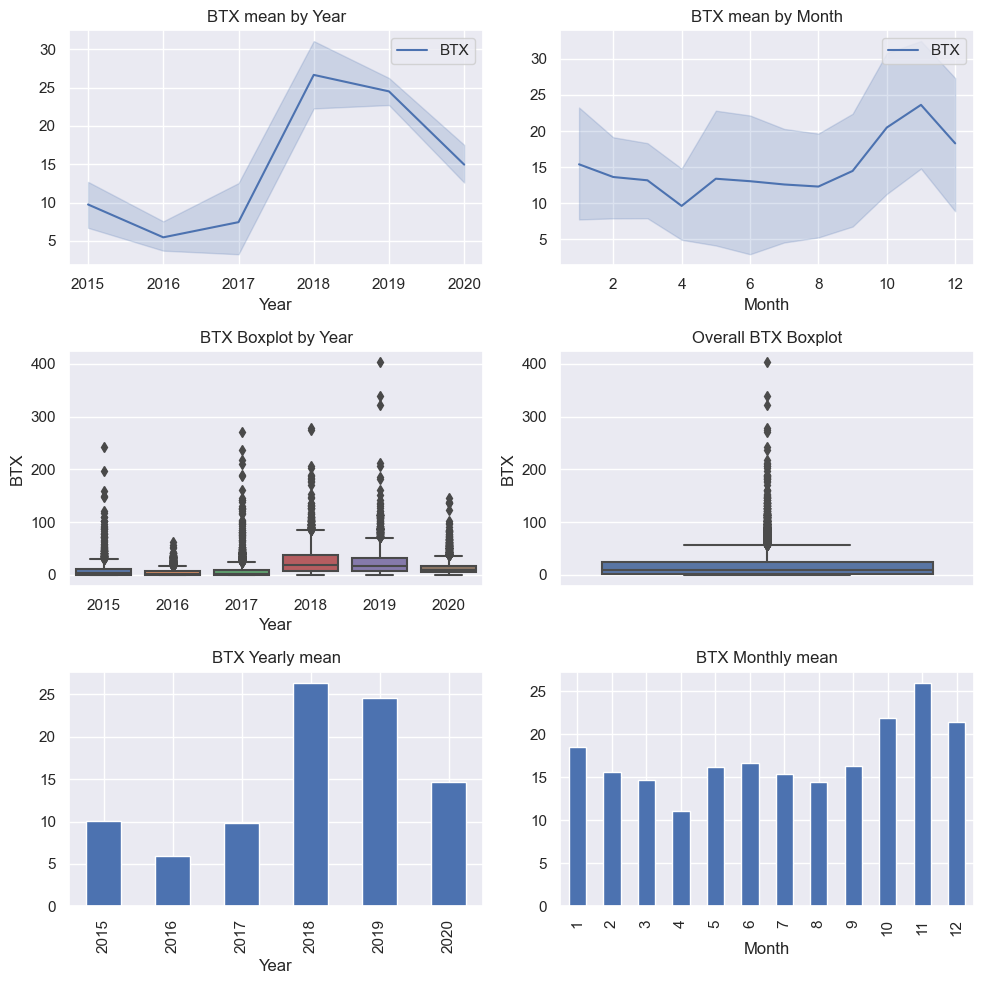

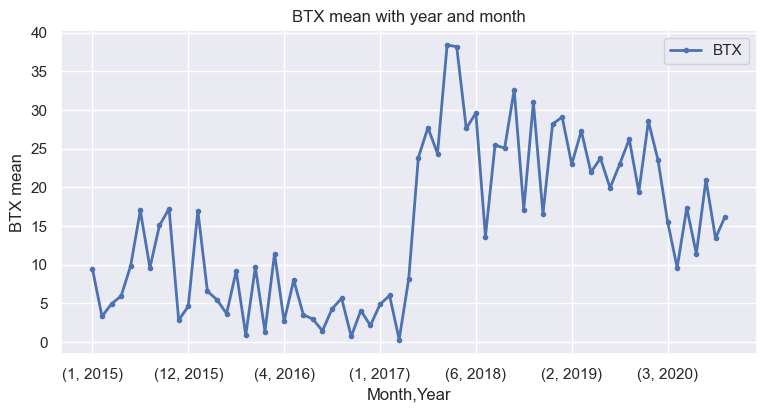

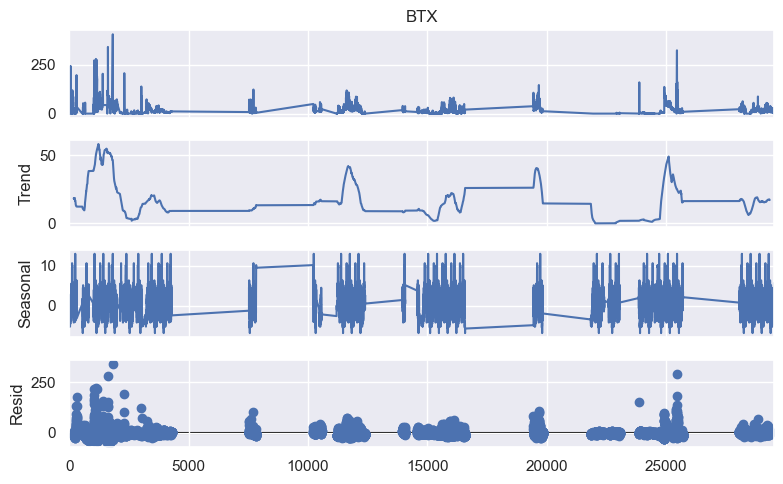

In [49]:
detailed_plot(city_day, 'BTX')

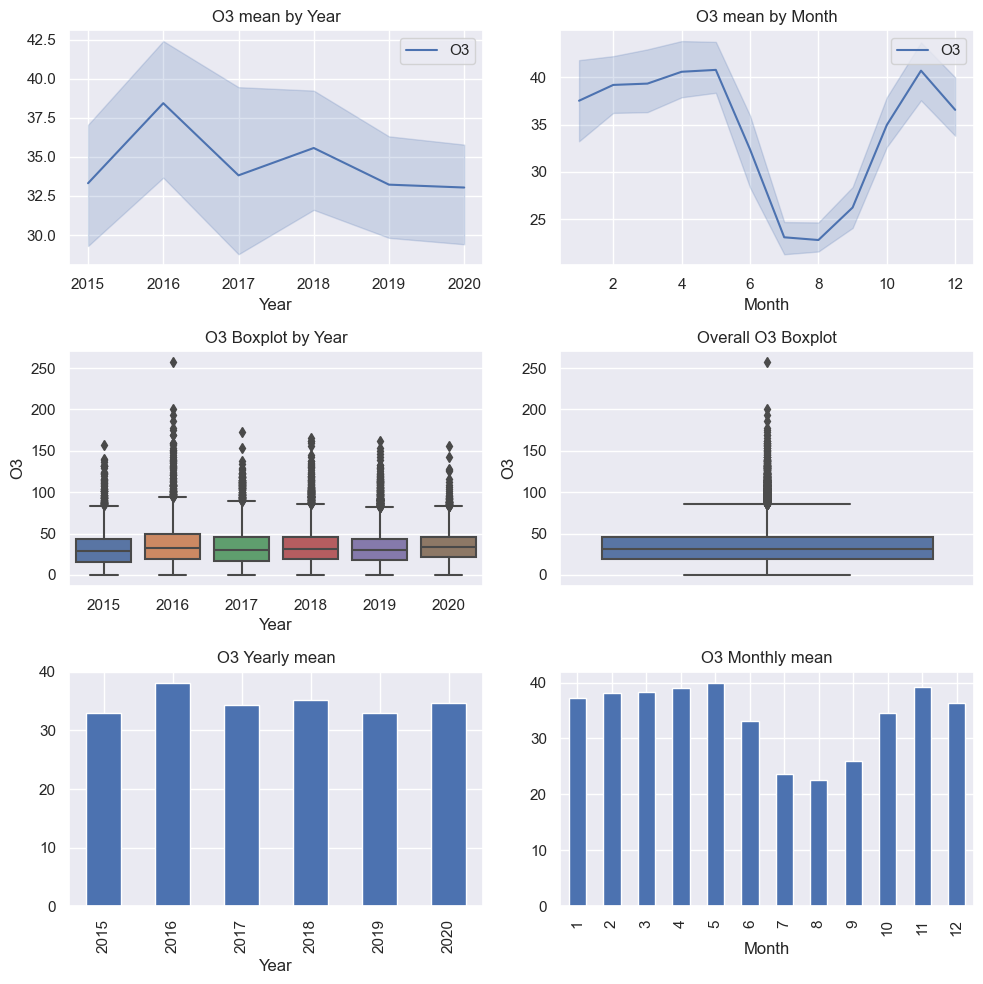

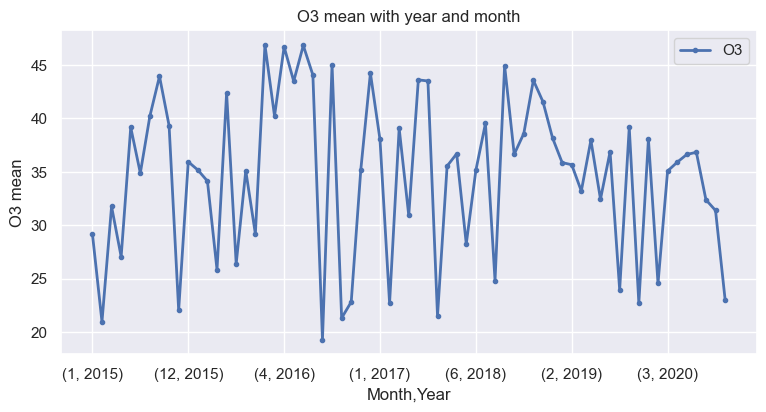

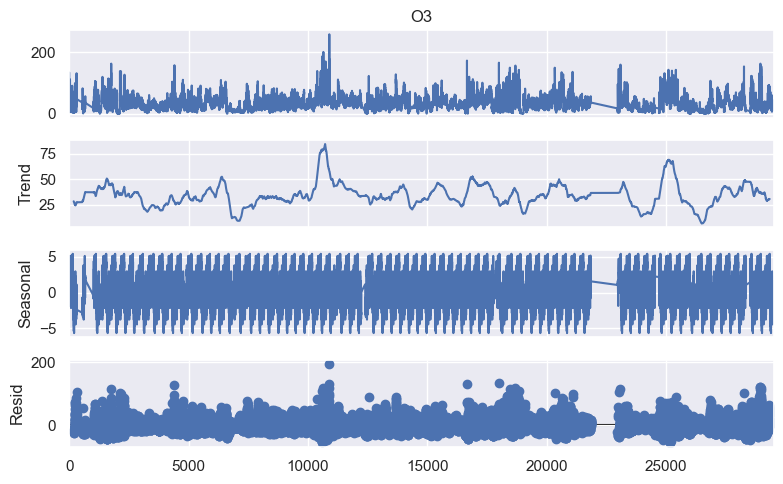

In [50]:
detailed_plot(city_day, 'O3')

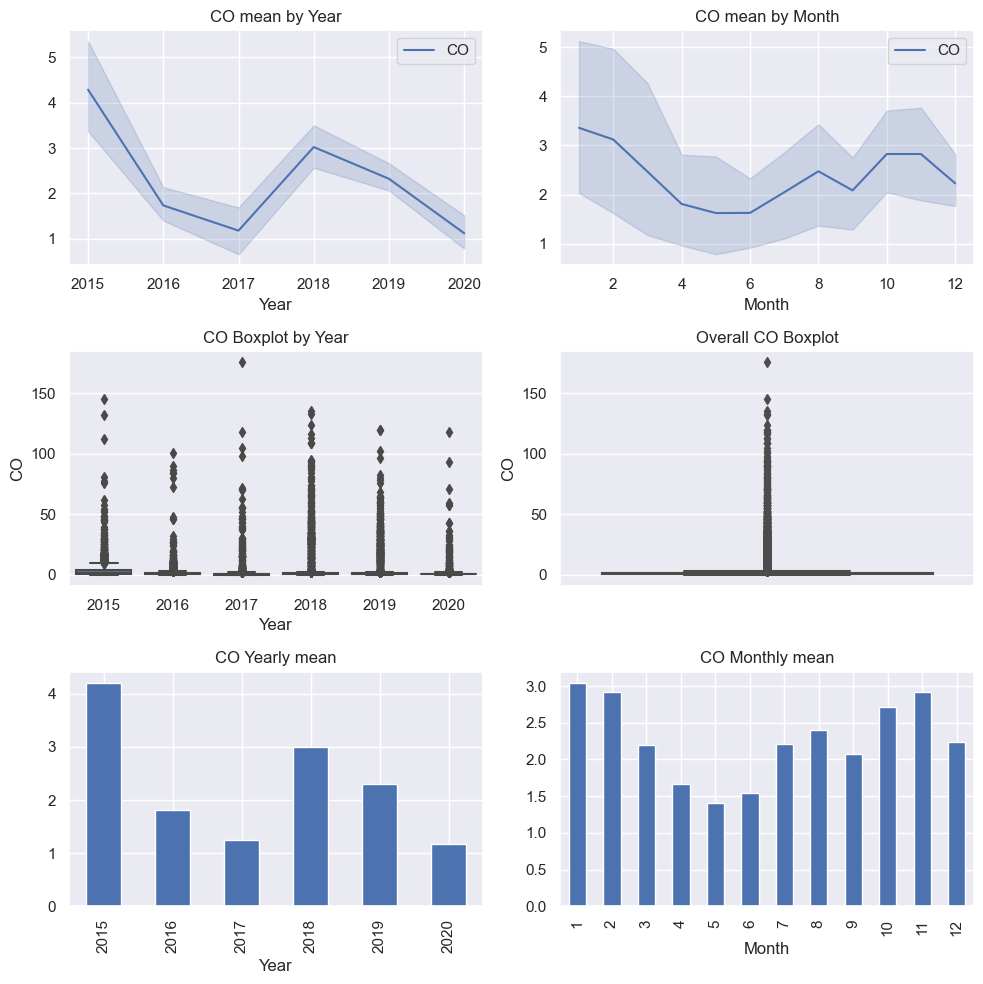

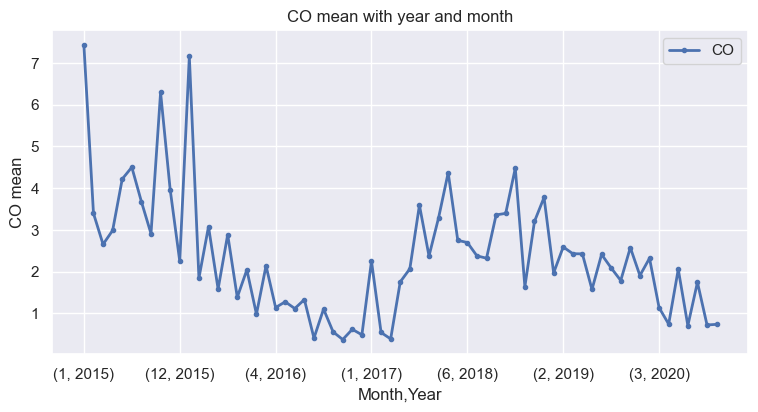

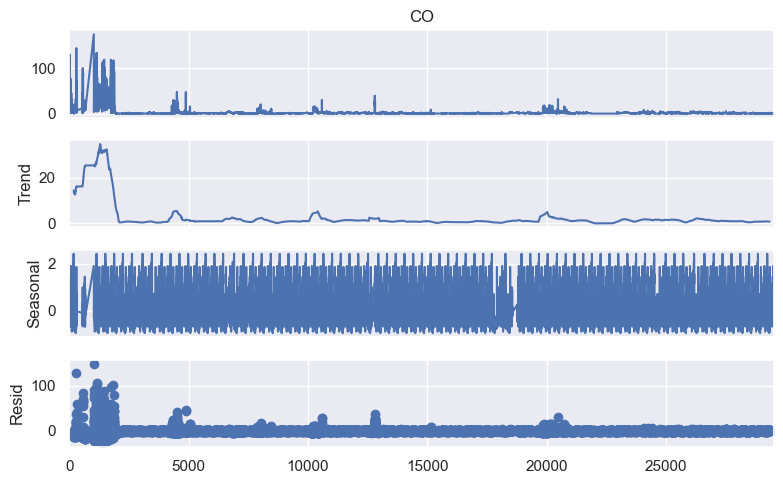

In [51]:
detailed_plot(city_day, 'CO')

**An important observation:**
- Extreme values (outliers) keeps on increasing, except in 2020, and in case of O3

In [52]:
sorted_df_so2 = city_day.groupby(['Month', 'Year'])['SO2'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_no = city_day.groupby(['Month', 'Year'])['NO'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_btx = city_day.groupby(['Month', 'Year'])['BTX'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_pm2_5 = city_day.groupby(['Month', 'Year'])['PM2.5'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_pm10 = city_day.groupby(['Month', 'Year'])['PM10'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_co = city_day.groupby(['Month', 'Year'])['CO'].mean().reset_index().sort_values('Year').reset_index(drop=True)
sorted_df_o3 = city_day.groupby(['Month', 'Year'])['O3'].mean().reset_index().sort_values('Year').reset_index(drop=True)


sorted_dfx = pd.concat([sorted_df_so2, sorted_df_no, sorted_df_btx, sorted_df_pm2_5, sorted_df_pm10, sorted_df_co, sorted_df_o3], axis=1, join='outer')
sorted_dfxx = sorted_dfx.copy()
sorted_dfx = sorted_dfx[['SO2', 'NO', 'BTX', 'PM2.5', 'PM10', 'O3', 'CO']]
sorted_dfx = pd.concat([sorted_dfxx.iloc[:, :2], sorted_dfx], axis=1)
sorted_dfx

,Month,Year,SO2,NO,BTX,PM2.5,PM10,O3,CO
0,1,2015,30.952143,17.637473,9.499504,165.061143,276.971290,29.229066,7.430047
1,7,2015,8.711705,9.496620,3.316082,40.875568,124.639677,20.984722,3.397903
2,6,2015,9.121095,9.765381,4.944943,58.354167,185.109667,31.769619,2.656208
3,9,2015,7.549372,12.902657,5.955034,51.234190,148.127209,27.066262,2.989494
4,5,2015,15.328441,12.628011,9.900476,62.960269,271.050645,39.162989,4.219861
...,...,...,...,...,...,...,...,...,...
62,2,2020,14.184353,23.041627,17.344132,64.646014,124.596657,36.630073,2.057355
63,5,2020,10.314967,14.684585,11.430031,28.078289,69.423856,36.835376,0.709377
64,1,2020,12.784753,22.834621,21.000174,75.860634,131.478246,32.392332,1.746163
65,6,2020,9.972095,11.160212,13.429450,24.778747,61.919722,31.396110,0.725303


<Axes: xlabel='Month,Year'>

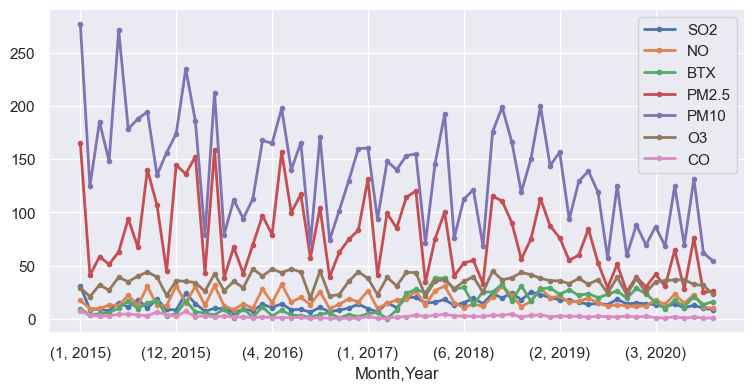

In [53]:
sorted_dfx.set_index(['Month', 'Year']).plot(marker='.', linewidth=2, figsize=(8, 4))

**PM2.5 and PM10 follows similar pattern**

<Axes: xlabel='Month,Year'>

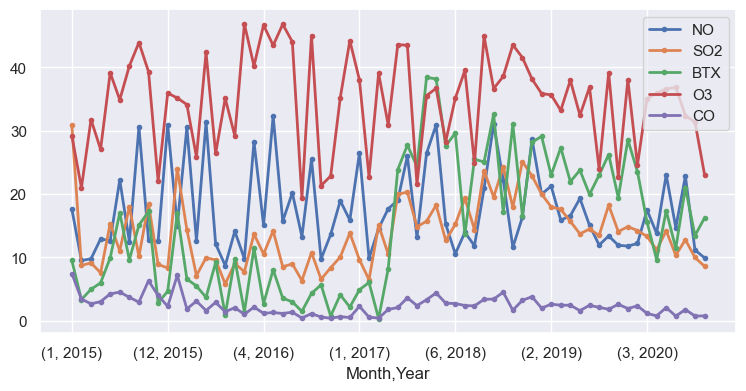

In [54]:
sorted_dfx[['Month', 'Year', 'NO', 'SO2', 'BTX', 'O3', 'CO']].set_index(['Month', 'Year']).plot(marker='.', linewidth=2, figsize=(8, 4))

### Spikes at each level for pollutants are very related, means everything spikes up or goes down together

In [55]:
df_so2 = city_day.groupby(['Year'])['SO2'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_no = city_day.groupby(['Year'])['NO'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_btx = city_day.groupby(['Year'])['BTX'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_pm2_5 = city_day.groupby(['Year'])['PM2.5'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_pm10 = city_day.groupby(['Year'])['PM10'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_o3 = city_day.groupby(['Year'])['O3'].mean().reset_index().sort_values('Year').reset_index(drop=True)
df_co = city_day.groupby(['Year'])['CO'].mean().reset_index().sort_values('Year').reset_index(drop=True)


dfx = pd.concat([df_so2, df_no, df_btx, df_pm2_5, df_pm10, df_o3, df_co], axis=1, join='outer')
dfxx = dfx.copy()
dfx = dfx[['SO2', 'NO', 'BTX', 'PM2.5', 'PM10', 'CO', 'O3']]
dfx = pd.concat([dfxx.iloc[:, :1], dfx], axis=1)
dfx

,Year,SO2,NO,BTX,PM2.5,PM10,CO,O3
0,2015,13.513310,16.588714,10.097567,83.323750,186.018164,4.205297,32.919829
1,2016,10.063124,19.408612,5.899706,92.223729,145.500156,1.807855,38.121916
2,2017,12.225970,17.666010,9.793452,86.034757,129.082620,1.256459,34.409825
3,2018,18.171016,18.813078,26.366420,69.230657,133.263001,3.004921,35.221742
4,2019,16.353351,16.443662,24.637751,58.958241,112.964335,2.298988,33.051420
5,2020,11.929246,17.133586,14.624296,43.910889,89.769234,1.164000,34.641542


In [56]:
dfx_long = dfx.melt(id_vars='Year', value_vars=dfx.columns[1:], var_name='Pollutants', value_name='Value')

px.bar(dfx_long, x='Year', y='Value', color='Pollutants', barmode='group')

**Observations:**

- BTX almost tripled from 2017 to 2018
- BTX, CO and SO2 follows almost a similar pattern for each year
- Average of pollutants is less for year 2020
- O3 is almost same for all years

In [57]:
df_so2 = city_day.groupby(['Month'])['SO2'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_no = city_day.groupby(['Month'])['NO'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_btx = city_day.groupby(['Month'])['BTX'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_pm2_5 = city_day.groupby(['Month'])['PM2.5'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_pm10 = city_day.groupby(['Month'])['PM10'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_o3 = city_day.groupby(['Month'])['O3'].mean().reset_index().sort_values('Month').reset_index(drop=True)
df_co = city_day.groupby(['Month'])['CO'].mean().reset_index().sort_values('Month').reset_index(drop=True)

dfx2 = pd.concat([df_so2, df_no, df_btx, df_pm2_5, df_pm10, df_o3, df_co], axis=1, join='outer')
dfxx2 = dfx2.copy()
dfx2 = dfx2[['SO2', 'NO', 'BTX', 'PM2.5', 'PM10', 'O3', 'CO']]
dfx2 = pd.concat([dfxx2.iloc[:, :1], dfx2], axis=1)
dfx2

,Month,SO2,NO,BTX,PM2.5,PM10,O3,CO
0,1,17.842014,24.600325,18.524982,107.757661,166.293820,37.278333,3.043315
1,2,16.829378,21.872488,15.549760,82.897863,147.695830,38.102372,2.915327
2,3,15.656436,16.716655,14.708544,63.933472,116.806991,38.298299,2.195853
3,4,14.202350,14.346990,11.082520,52.636271,105.590680,39.002945,1.671886
4,5,14.299050,13.186773,16.136031,51.305960,105.301199,39.926681,1.406012
5,6,11.562777,11.116027,16.667040,43.366795,85.632658,33.152365,1.541524
6,7,11.514026,11.976342,15.340541,37.748540,71.044805,23.661709,2.206700
7,8,12.043717,12.032966,14.488411,33.783760,69.218997,22.556413,2.395808
8,9,10.979659,12.846809,16.291751,37.995837,74.061981,25.964337,2.073889
9,10,14.765776,21.170334,21.902829,74.648714,124.894859,34.551827,2.716605


In [58]:
dfx2_long = dfx2.melt(id_vars='Month', value_vars=dfx2.columns[1:], var_name='Pollutants', value_name='Value')

px.bar(dfx2_long, x='Month', y='Value', color='Pollutants', barmode='group')

**All of the pollutants levels are highest during Winters**

In [59]:
a = pd.DataFrame(city_day.groupby(['City'])['PM2.5'].mean()).reset_index()

for pollutant in (pollutants + ['Particulate_matter'])[1:]:
    b = pd.DataFrame(city_day.groupby(['City'])[pollutant].mean()).reset_index()
    a = pd.merge(a, b)
    
a

,City,PM2.5,PM10,NO2,CO,SO2,O3,BTX,Particulate_matter
0,Ahmedabad,67.854497,114.584029,59.025496,22.193407,55.253733,39.155408,37.105207,162.407463
1,Aizawl,17.130000,23.352857,0.388496,0.283628,7.378053,3.707692,NaN,40.942273
2,Amaravati,37.773217,76.362020,22.175748,0.627904,14.258341,38.115100,3.681789,114.328352
3,Amritsar,55.468335,115.202599,18.522116,0.551301,8.148917,22.416148,14.576607,173.953091
4,Bengaluru,35.819828,83.243287,27.995042,1.838634,5.519021,32.868086,NaN,121.017517
5,Bhopal,50.059571,119.324321,31.345321,0.880393,13.064821,59.851036,NaN,169.383893
6,Brajrajnagar,64.057610,124.217373,16.520540,1.798274,9.783221,16.599660,NaN,189.681965
7,Chandigarh,41.130242,85.656546,11.611067,0.631349,10.159375,20.047204,9.087533,126.563633
8,Chennai,50.425613,62.834404,16.857623,1.067349,7.877182,32.443816,NaN,99.185795
9,Coimbatore,29.151587,37.982137,28.784533,0.949321,8.601880,28.833473,NaN,67.308992


In [60]:
def display_side_by_side(dfs:list, captions:list):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    """
    output = ""
    combined = dict(zip(captions, dfs))
    for caption, df in combined.items():
        output += df.style.background_gradient(cmap='Reds').set_table_attributes("style='display:inline'")\
            .set_caption(caption)._repr_html_()
        output += "\xa0\xa0\xa0"
    display(HTML(output))


pc_list = []
for pollutant in (pollutants + ['Particulate_matter']):
    dfp = a[['City', pollutant]].sort_values(str(pollutant), ascending=False).reset_index(drop=True).iloc[:10, :]
    pc_list.append(dfp)
    
display_side_by_side(pc_list, (pollutants + ['Particulate_matter']))

,City,PM2.5
0,Patna,123.498562
1,Delhi,117.196153
2,Gurugram,117.104007
3,Lucknow,109.714059
4,Ahmedabad,67.854497
5,Kolkata,64.362833
6,Jorapokhar,64.228918
7,Brajrajnagar,64.057610
8,Guwahati,63.685429
9,Talcher,61.405425


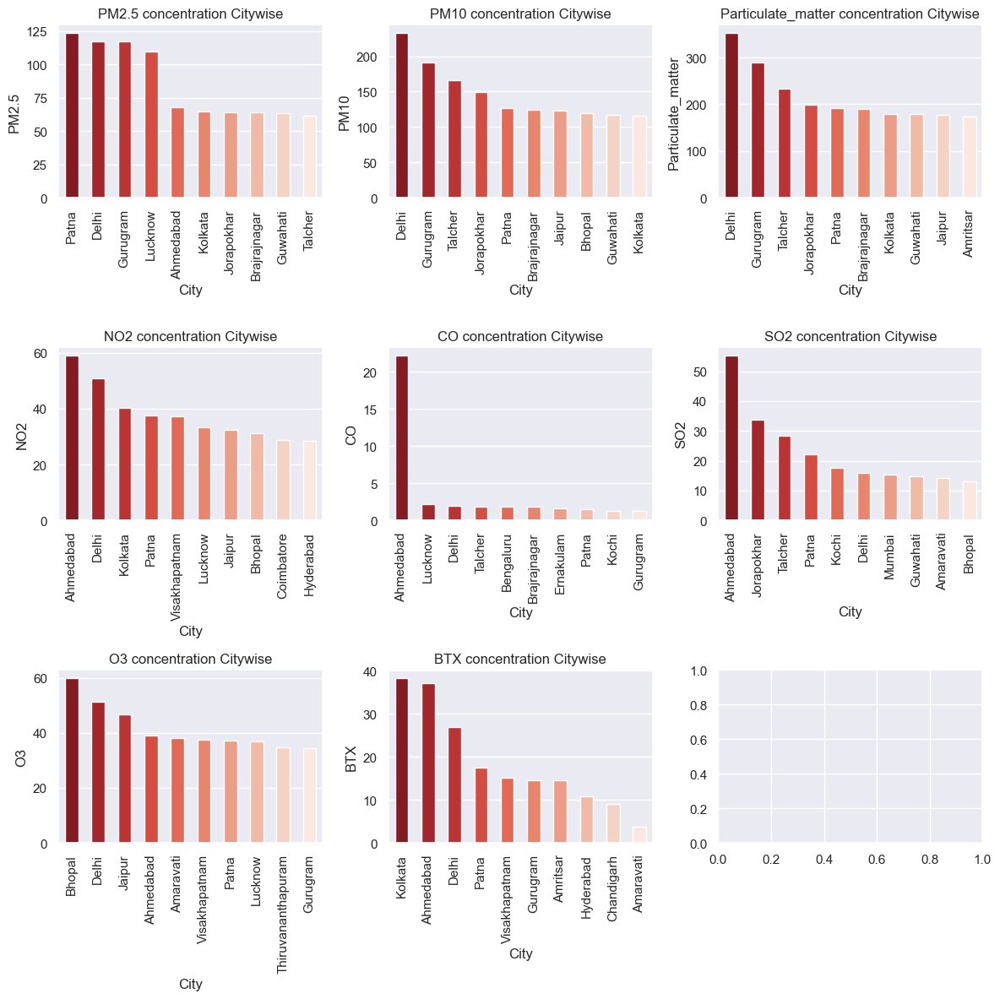

In [61]:
fig, ax = plt.subplots(3, 3, figsize=(12, 12))


def city_pol_plot(pollutant, axes0, axes1):
    m = a[['City', str(pollutant)]].sort_values(str(pollutant), ascending=False).reset_index(drop=True).iloc[:10, :]
    sns.barplot(m, x='City', y=str(pollutant), palette='Reds_r', width=0.5, dodge=False, ax=ax[axes0][axes1])
    ax[axes0][axes1].set_xticklabels(m['City'], rotation=90)
    ax[axes0][axes1].set_title(f'{pollutant} concentration Citywise')


city_pol_plot('PM2.5', 0, 0)
city_pol_plot('PM10', 0, 1)
city_pol_plot('Particulate_matter', 0, 2)
city_pol_plot('NO2', 1, 0)
city_pol_plot('CO', 1, 1)
city_pol_plot('SO2', 1, 2)
city_pol_plot('O3', 2, 0)
city_pol_plot('BTX', 2, 1)

    
plt.tight_layout()
plt.show()

**Ahmedabad, Patna, Delhi and Gurugram are consistent with large number of pollutants**

- Ahmedabad has largest concentration of CO2, SO2 and CO
- Delhi and Gurugram has highest Particulate Matter concentration

# AQI Analysis

In [62]:
aqi_df = pd.DataFrame(city_day.groupby(['City', 'AQI_Bucket'])['AQI_Bucket'].count()).rename(columns={'AQI_Bucket': 'Count'}).reset_index()

def show_AQI(df, info):
    aqi_info_df = df.loc[df.AQI_Bucket == info]
    aqi_info_df.rename(columns={'Count': str(info)}, inplace=True)
    return aqi_info_df[['City', str(info)]]


good_aqi = show_AQI(aqi_df, 'Good')
satisfactory_aqi = show_AQI(aqi_df, 'Satisfactory')
moderate_aqi = show_AQI(aqi_df, 'Moderate')
severe_aqi = show_AQI(aqi_df, 'Severe')
very_poor_aqi = show_AQI(aqi_df, 'Very Poor')
poor_aqi = show_AQI(aqi_df, 'Poor')

good_df = pd.merge(good_aqi, satisfactory_aqi, how='outer', on='City')
good_df = pd.merge(good_df, moderate_aqi, how='outer', on='City')
good_df = pd.merge(good_df, severe_aqi, how='outer', on='City')
good_df = pd.merge(good_df, very_poor_aqi, how='outer', on='City')
good_df = pd.merge(good_df, poor_aqi, how='outer', on='City')


good_df

,City,Good,Satisfactory,Moderate,Severe,Very Poor,Poor
0,Ahmedabad,1.0,43,198.0,638.0,216.0,238.0
1,Aizawl,83.0,28,NaN,NaN,NaN,NaN
2,Amaravati,158.0,409,219.0,NaN,8.0,47.0
3,Amritsar,84.0,473,448.0,7.0,47.0,67.0
4,Bengaluru,115.0,1124,630.0,NaN,5.0,36.0
5,Bhopal,2.0,76,165.0,NaN,4.0,31.0
6,Brajrajnagar,14.0,122,421.0,NaN,36.0,120.0
7,Chandigarh,48.0,154,74.0,NaN,3.0,20.0
8,Chennai,12.0,941,804.0,6.0,11.0,110.0
9,Coimbatore,43.0,288,13.0,NaN,NaN,NaN


In [63]:
good_bar = good_aqi.sort_values('Good', ascending=False).reset_index(drop=True).set_index('City')

fig = px.bar(good_bar, x=good_bar.index, y='Good', color='Good', color_continuous_scale=[(0,"lightgreen"), (1,"green")])

fig.show()

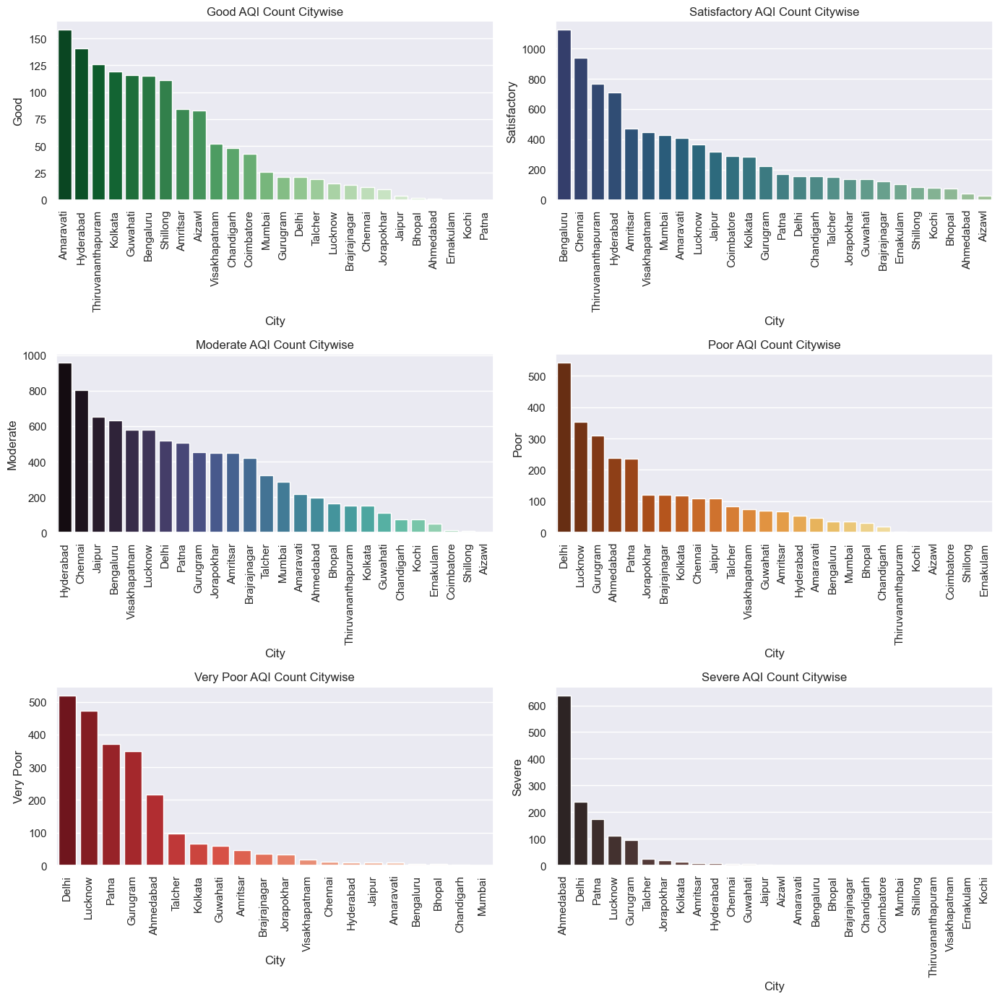

In [64]:
fig, ax = plt.subplots(3, 2, figsize=(14, 14))

def plot_quality(value, palette, axes0, axes1):
    sns.barplot(good_df.sort_values(value.capitalize(), ascending=False), x='City', y=value.capitalize(), palette=palette, ax=ax[axes0][axes1])
    ax[axes0][axes1].set_xticklabels(good_df.sort_values(value.capitalize(), ascending=False)['City'], rotation=90)
    ax[axes0][axes1].set_title(f'{value.capitalize()} AQI Count Citywise')
    
plot_quality('good', 'Greens_r', 0, 0)
plot_quality('satisfactory', 'crest_r', 0, 1)
plot_quality('moderate', 'mako', 1, 0)
plot_quality('poor', 'YlOrBr_r', 1, 1)

sns.barplot(very_poor_aqi.sort_values('Very Poor', ascending=False), x='City', y='Very Poor', palette="Reds_r", ax=ax[2][0])
ax[2][0].set_xticklabels(very_poor_aqi.sort_values('Very Poor', ascending=False)['City'], rotation=90)
ax[2][0].set_title('Very Poor AQI Count Citywise')

plot_quality('severe', 'dark:salmon', 2, 1)

fig.tight_layout()
plt.show()

### Observations:

- Ahmedabad, Delhi, Gurugram, Lucknow and Patna occupies in all of Severe, Poor and Very Poor AQI quality
- Bengaluru, Amravate, Hyderabad, Thiruvananthapuram air is in Good and Satisfactory levels

<Axes: xlabel='Date'>

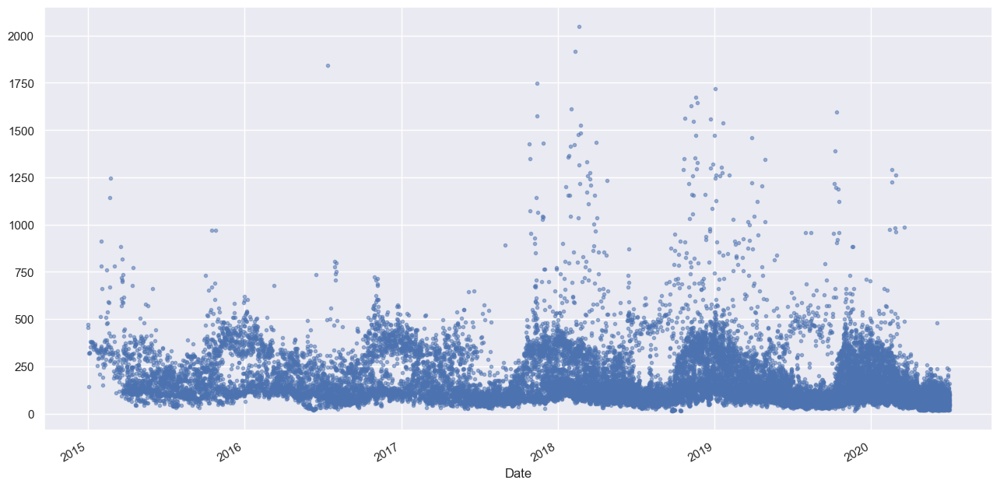

In [65]:
city_day.set_index('Date').AQI.plot(marker='.', alpha=0.5, linestyle='None', figsize=(14, 8))

- **AQI levels have increased drastically after 2017, and we can see some reductions in 2020(atleast the severe values of AQI)**
- **It follows seasonal type pattern**

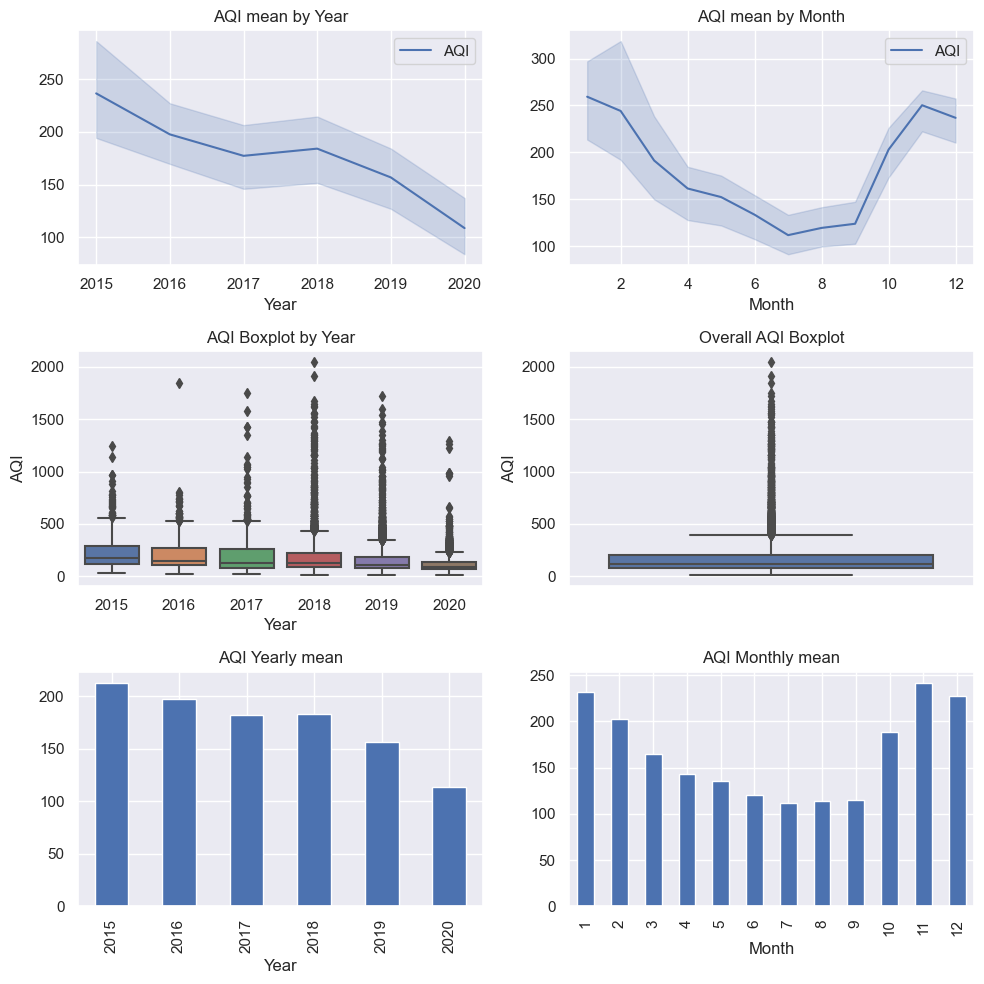

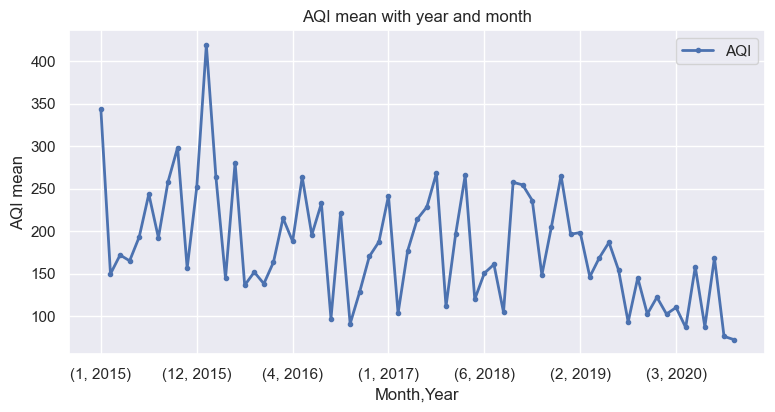

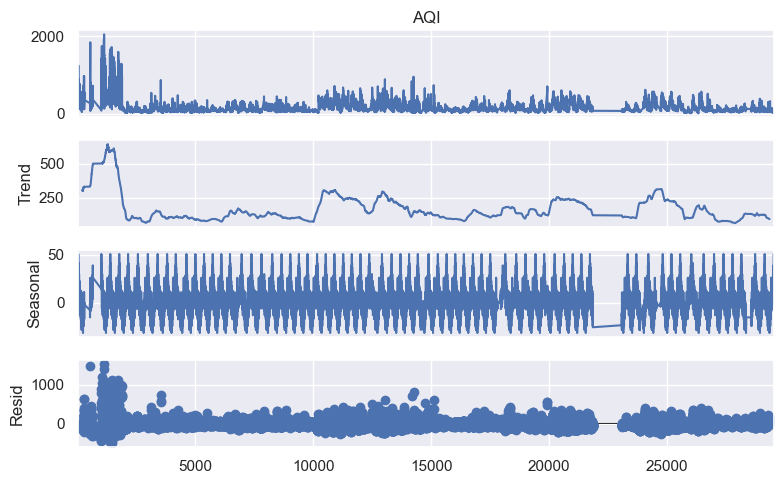

In [66]:
detailed_plot(city_day, 'AQI')

**We can see:**
- AQI decreasing with years
- Seasonal pattern
- More AQI during winters
- Extreme values of AQI (Oultiers) keeps on increasing, untill 2020

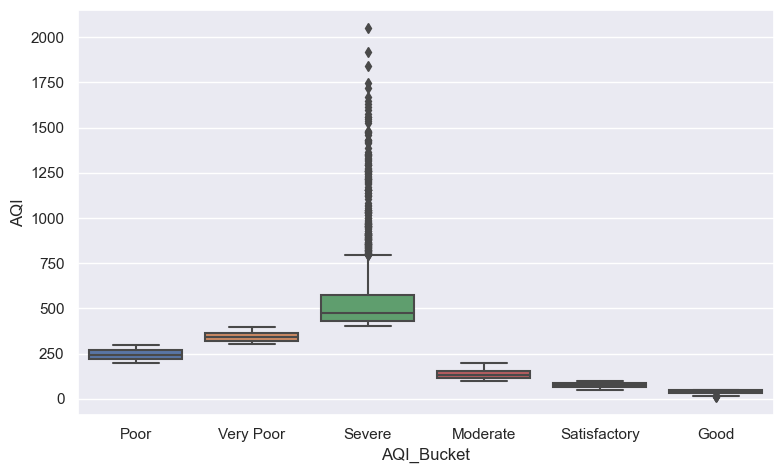

In [67]:
sns.boxplot(city_day, x='AQI_Bucket', y='AQI');

**Severe cases have most outliers (i.e. even more severe conditions)**

In [68]:
px.bar(pd.DataFrame(city_day.groupby(['City', 'AQI_Bucket']).AQI.mean()).reset_index(), x='AQI_Bucket', 
       y='AQI', color='City', title="City wise AQI Bracket comparison")

## Effect of Lockdowns on Cities

In [69]:
major_cities = ['Ahmedabad', 'Delhi', 'Gurugram', 'Chennai', 'Kolkata', 'Bengaluru', 'Hyderabad', 'Mumbai']

recent_data = city_day.loc[(city_day.City.isin(major_cities)) & (city_day.Date.dt.year >= 2019)][['City', 'Date', 'AQI', 'AQI_Bucket']].reset_index(drop=True)
recent_data

,City,Date,AQI,AQI_Bucket
0,Ahmedabad,2019-01-01,1474.0,Severe
1,Ahmedabad,2019-01-02,1246.0,Severe
2,Ahmedabad,2019-01-03,1719.0,Severe
3,Ahmedabad,2019-01-04,1264.0,Severe
4,Ahmedabad,2019-01-05,1127.0,Severe
...,...,...,...,...
4379,Mumbai,2020-06-27,64.0,Satisfactory
4380,Mumbai,2020-06-28,64.0,Satisfactory
4381,Mumbai,2020-06-29,54.0,Satisfactory
4382,Mumbai,2020-06-30,54.0,Satisfactory


In [70]:
fig = px.bar(recent_data, x='Date', y='AQI', color='City')
fig.add_vline(x=pd.to_datetime('2020-03-22'))

In [71]:
aqi_cityd = recent_data[['City', 'Date', 'AQI']].pivot(index='Date', columns='City', values='AQI')
aqi_cityd

City,Ahmedabad,Bengaluru,Chennai,Delhi,Gurugram,Hyderabad,Kolkata,Mumbai
Date,,,,,,,,
2019-01-01,1474.0,128.0,212.0,475.0,450.0,132.0,370.0,181.0
2019-01-02,1246.0,103.0,158.0,501.0,433.0,133.0,351.0,175.0
2019-01-03,1719.0,101.0,167.0,537.0,462.0,141.0,363.0,239.0
2019-01-04,1264.0,106.0,192.0,432.0,384.0,142.0,431.0,221.0
2019-01-05,1127.0,104.0,116.0,440.0,392.0,148.0,391.0,180.0
...,...,...,...,...,...,...,...,...
2020-06-27,92.0,51.0,95.0,112.0,121.0,58.0,37.0,64.0
2020-06-28,82.0,61.0,98.0,196.0,153.0,49.0,43.0,64.0
2020-06-29,74.0,65.0,104.0,233.0,140.0,47.0,48.0,54.0


In [72]:
fig = make_subplots(rows=len(major_cities), cols=1, subplot_titles=major_cities)

rowx=1
colx=1
for city in major_cities:
    fig.add_trace(go.Bar(x=aqi_cityd.index, y=aqi_cityd[str(city)], 
                  marker=dict(color=aqi_cityd[str(city)], coloraxis="coloraxis")), row=rowx, col=colx)
    rowx+=1
    
fig.update_layout(coloraxis=dict(colorscale='Temps'),showlegend=False,title_text="AQI Levels")
fig.update_layout(plot_bgcolor='white')
fig.update_layout( width=800,height=1200,shapes=[
      dict(
      type= 'line',
      yref= 'paper', y0= 0, y1= 1,
      xref= 'x', x0= '2020-03-22', x1= '2020-03-22'
    )
])

fig.show()

**OBSERVATIONS:**
- Huge decrease in AQI during Lockdown period

## Calculating decrease in AQI

In [73]:
lockdown_dates = pd.date_range(start=pd.to_datetime('2020-03-22'), end=recent_data.Date.max())
ld = pd.DataFrame(lockdown_dates, columns=['Date2020'])

ld['Date2019'] = ld.Date2020.apply(lambda x: pd.to_datetime(f'{2019}-{x.month}-{x.day}'))
ld['Date2018'] = ld.Date2020.apply(lambda x: pd.to_datetime(f'{2018}-{x.month}-{x.day}'))

ld

,Date2020,Date2019,Date2018
0,2020-03-22,2019-03-22,2018-03-22
1,2020-03-23,2019-03-23,2018-03-23
2,2020-03-24,2019-03-24,2018-03-24
3,2020-03-25,2019-03-25,2018-03-25
4,2020-03-26,2019-03-26,2018-03-26
...,...,...,...
97,2020-06-27,2019-06-27,2018-06-27
98,2020-06-28,2019-06-28,2018-06-28
99,2020-06-29,2019-06-29,2018-06-29
100,2020-06-30,2019-06-30,2018-06-30


In [74]:
data2020 = city_day.loc[(city_day.Date.isin(list(ld.Date2020))) & (city_day.City.isin(major_cities))]\
    [['City', 'Date', 'AQI']].reset_index(drop=True)

data2019 = city_day.loc[(city_day.Date.isin(list(ld.Date2019))) & (city_day.City.isin(major_cities))]\
    [['City', 'Date', 'AQI']].reset_index(drop=True)

data2018 = city_day.loc[(city_day.Date.isin(list(ld.Date2018))) & (city_day.City.isin(major_cities))]\
    [['City', 'Date', 'AQI']].reset_index(drop=True)


mean2018 = pd.DataFrame(data2018.groupby(['City']).AQI.mean()).reset_index()
mean2018.rename(columns={'AQI': 'AQI_2018'}, inplace=True)

mean2019 = pd.DataFrame(data2019.groupby(['City']).AQI.mean()).reset_index()
mean2019.rename(columns={'AQI': 'AQI_2019'}, inplace=True)

mean2020 = pd.DataFrame(data2020.groupby(['City']).AQI.mean()).reset_index()
mean2020.rename(columns={'AQI': 'AQI_2020'}, inplace=True)

mean_years = pd.merge(mean2018, mean2019, on='City')
mean_years = pd.merge(mean_years, mean2020, on='City')

mean_years.style.background_gradient(cmap='RdYlGn_r', axis=1)

,City,AQI_2018,AQI_2019,AQI_2020
0,Ahmedabad,476.950000,512.851064,121.920000
1,Bengaluru,83.775510,102.411765,66.529412
2,Chennai,84.813725,100.088235,79.588235
3,Delhi,232.931373,214.333333,125.990196
4,Gurugram,219.591398,205.762376,126.852941
5,Hyderabad,90.333333,92.813725,64.509804
6,Kolkata,75.217391,88.284314,60.617647
7,Mumbai,81.272727,88.598039,64.872549


In [75]:
px.line(mean_years, x='City', y=['AQI_2018', 'AQI_2019', 'AQI_2020'])

In [76]:
mean_years['pct_decrease'] = ((mean_years.iloc[:, :2].mean(axis=1) - mean_years['AQI_2020'])/mean_years.iloc[:, :2].mean(axis=1))*100
mean_years.sort_values('pct_decrease', ascending=False, inplace=True)
mean_years.reset_index(drop=True, inplace=True)
mean_years[['City', 'pct_decrease']].style.background_gradient(cmap='Greens')

,City,pct_decrease
0,Ahmedabad,74.437572
1,Delhi,45.911023
2,Gurugram,42.232281
3,Hyderabad,28.586933
4,Bengaluru,20.586086
5,Mumbai,20.179190
6,Kolkata,19.410065
7,Chennai,6.161137


**OBSERVATIONS:**
- We can see the major decrease in AQI in Ahmedabad
- Also there is a substantial decrease in Delhi and Gurugram
- There is little decrease in other Cities

## Pollutants comparison for Lockdown for different cities

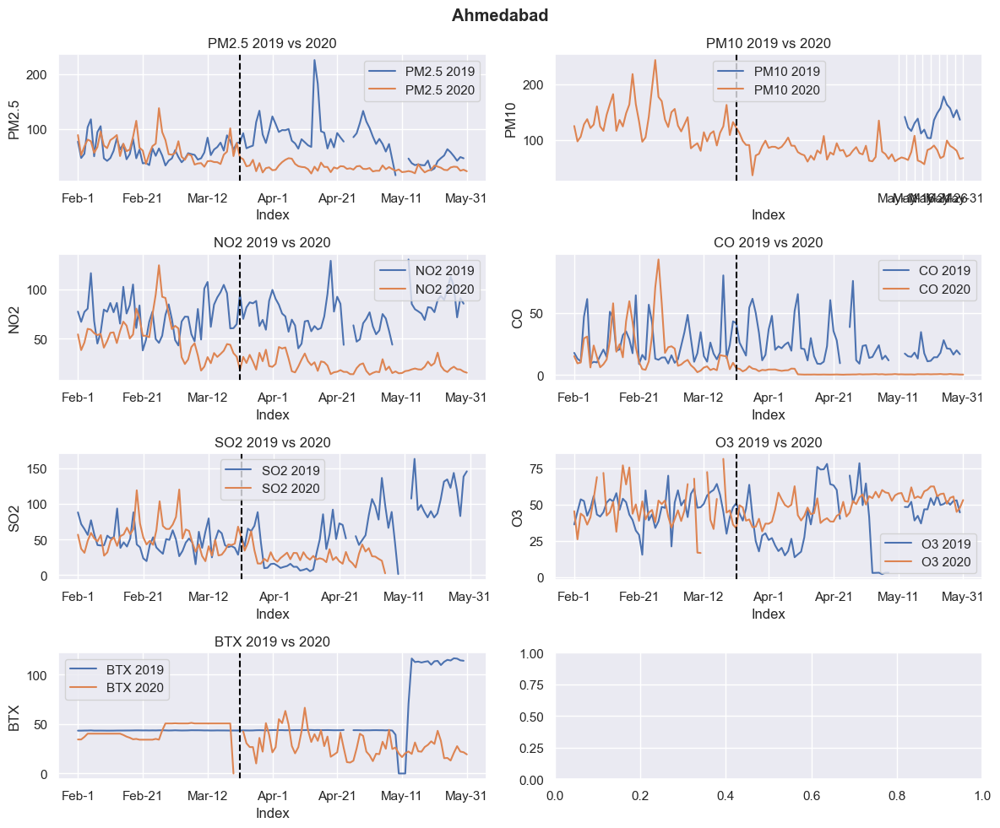

In [77]:
def plot19vs20(city):
    fig, ax = plt.subplots(4, 2, figsize=(12, 10))
    fig.suptitle(str(city), fontweight='bold')
    
    df_city = city_day.loc[(city_day.City == str(city)) & (city_day.Year >= 2019) & (city_day.Month.isin([2, 3, 4, 5]))][['Date'] + pollutants].reset_index(drop=True)
    df_city19 = df_city.loc[df_city.Date.dt.year == 2019].reset_index(drop=True)
    df_city20 = df_city.loc[df_city.Date.dt.year == 2020].reset_index(drop=True)

    df_city19['Month'] = df_city19.Date.dt.month
    df_city19['Day'] = df_city19.Date.dt.day
    df_city20['Month'] = df_city20.Date.dt.month
    df_city20['Day'] = df_city20.Date.dt.day
    
    df_city20['Day'] = df_city20['Day'].astype(str)
    df_city19['Day'] = df_city19['Day'].astype(str)

    mmap = {2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May'}
    df_city19['Month'] = df_city19['Month'].map(mmap)
    df_city20['Month'] = df_city20['Month'].map(mmap)

    df_city19['index'] = df_city19['Month'] + '-' + df_city19['Day']
    df_city20['index'] = df_city20['Month'] + '-' + df_city20['Day']
    df_city19.set_index('index', inplace=True)
    df_city20.set_index('index', inplace=True)

    axes0 = 0
    axes1 = 0
    for pollutant in pollutants:
        if axes1 == 2:
            axes1 = 0
            axes0+=1
        df_city19[str(pollutant)].plot(ax=ax[axes0][axes1], label=f'{pollutant} 2019')
        df_city20[str(pollutant)].plot(ax=ax[axes0][axes1], label=f'{pollutant} 2020')
        ax[axes0][axes1].legend()
        ax[axes0][axes1].set_ylabel(f'{pollutant}')
        ax[axes0][axes1].set_xlabel('Index')
        ax[axes0][axes1].set_title(f'{pollutant} 2019 vs 2020')
        ax[axes0][axes1].axvline(x=50, color='black', linestyle='--')
        axes1+=1

    plt.tight_layout()
    plt.show()
    
plot19vs20('Ahmedabad')

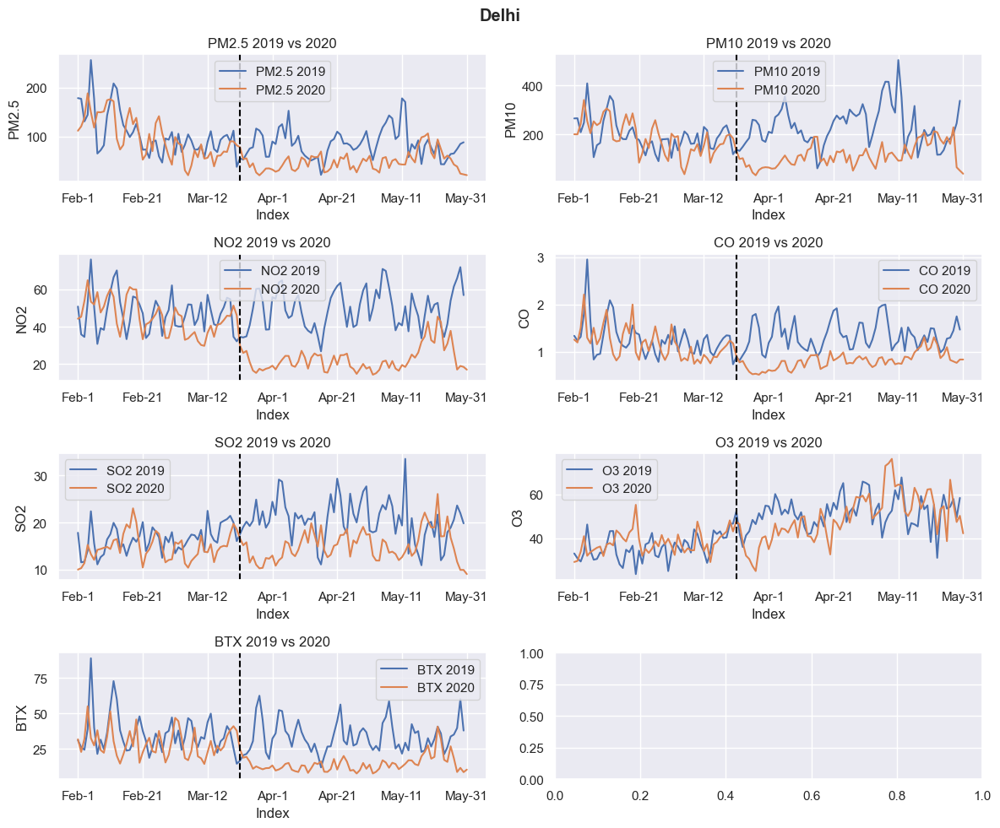

In [78]:
plot19vs20('Delhi')

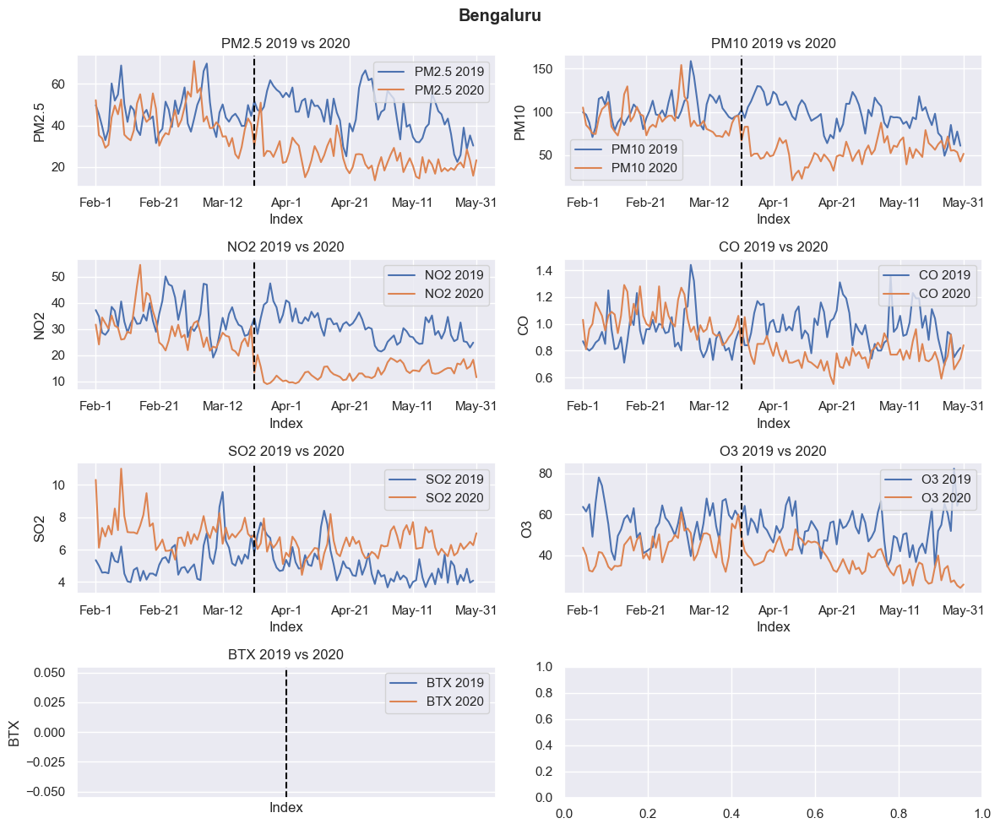

In [79]:
plot19vs20('Bengaluru')

**All pollutants levels gets decreased in 2020**

## Geographical Analysis

In [80]:
mean_years = pd.merge(mean_years, cities_db, on='City')
mean_years.iloc[:, 1:5] = mean_years.iloc[:, 1:5].round(0)
mean_years

,City,AQI_2018,AQI_2019,AQI_2020,pct_decrease,Lat,Long,country,iso2,State
0,Ahmedabad,477.0,513.0,122.0,74.0,23.025793,72.587265,India,IN,Gujarat
1,Delhi,233.0,214.0,126.0,46.0,28.651952,77.231495,India,IN,Delhi
2,Gurugram,220.0,206.0,127.0,42.0,28.460105,77.026352,India,IN,Haryana
3,Hyderabad,90.0,93.0,65.0,29.0,17.384052,78.456355,India,IN,Telangana
4,Bengaluru,84.0,102.0,67.0,21.0,12.977063,77.587106,India,IN,Karnataka
5,Mumbai,81.0,89.0,65.0,20.0,18.987807,72.836447,India,IN,Maharashtra
6,Chennai,85.0,100.0,80.0,6.0,13.084622,80.248357,India,IN,Tamil Nadu


In [81]:
m = plugins.DualMap(location=(22.9734, 78.6569), tiles=None, zoom_start=5)

folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('openstreetmap').add_to(m)


fg_1 = folium.FeatureGroup(name='2019').add_to(m.m1)
fg_2 = folium.FeatureGroup(name='2020').add_to(m.m2)



for lat, lon, value, name in zip(mean_years['Lat'], mean_years['Long'], mean_years['AQI_2019'], mean_years['City']):
    folium.CircleMarker([lat, lon],
                        radius=20,
                        icon=folium.Icon(color='red'),
                        popup = ('<strong>City</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>AQI(Average)</strong>: ' + str(value) + '<br>'),
                        fill_color='red',
                        fill_opacity=0.7 ).add_to(fg_1)


for lat, lon, value, name in zip(mean_years['Lat'], mean_years['Long'], mean_years['AQI_2020'], mean_years['City']):
    folium.CircleMarker([lat, lon],
                        radius=20,
                        icon=folium.Icon(color='orange'),
                        popup = ('<strong>City</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>AQI(Average)</strong>: ' + str(value) + '<br>'),
                        fill_color='orange',
                        fill_opacity=0.7 ).add_to(fg_2)


folium.LayerControl(collapsed=False).add_to(m)

m